In [2]:
# Ruohe Zhou
# Suriya Kasiyalan Siva
# Saikiran Juttu
# Poojit Maddineni
# CS 5330: Pattern Recognition & Computer Vision 
# Professor – Dr. Bruce Maxwell
# Spring 2024
#
# Project Title: Segmentation and Auto-labeling of Insect's Legs Using Machine Learning for DeepLabCut 


In [ ]:
from google.colab import drive
drive.mount("/content/drive/", force_remount=True)

# Enhanced Feature Detection in Images Using Canny Edge and Shi-Tomasi Methods

This Python script demonstrates using a combination of Canny edge detection and Shi-Tomasi corner detection, known as the Good Features to Track method, for feature extraction. The process begins by applying Gaussian blurring to reduce noise, and then utilizing the Canny algorithm to detect edges within the image. Subsequently, the Shi-Tomasi method is applied to these edges to identify and highlight key corner features. The second function in the script, feature_corners_draw, visualizes these corners by drawing them on the original images, facilitating easy verification and analysis of the detected features.

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [ ]:
def canny(frame_num):
  img_url = '/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg'
  image = cv2.imread(img_url, cv2.IMREAD_GRAYSCALE)
  blurred = cv2.GaussianBlur(image, (5, 5), 0)
  edges = cv2.Canny(blurred, 0, 150)
  corners = cv2.goodFeaturesToTrack(edges, 40, 0.01, 10)
  corners = np.int0(corners)
  return corners

def feature_corners_draw(corner,frame_num):
  img_url = '/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg'
  img = cv2.imread(img_url)
  for corner in corner:
    x, y = corner.ravel()
    cv2.circle(img, (x,y), 3, 255, -1)
  cv2_imshow(img)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

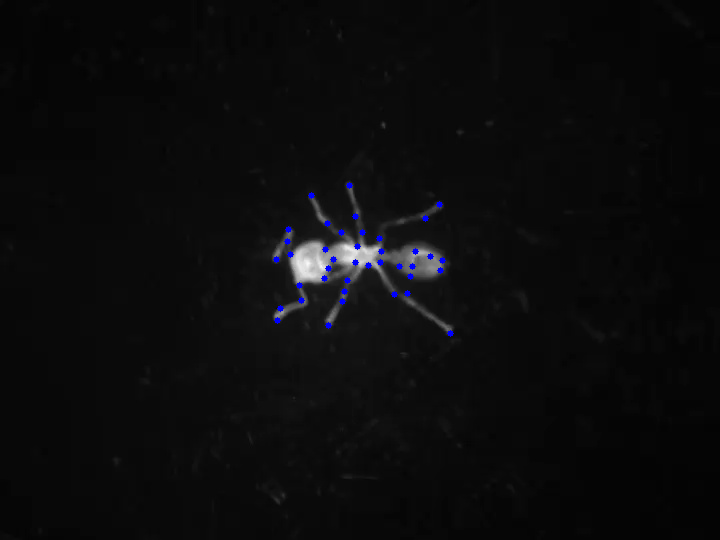

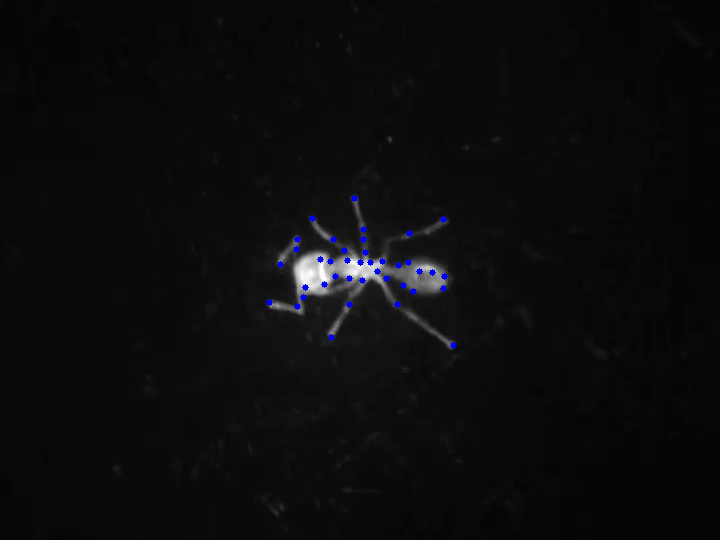

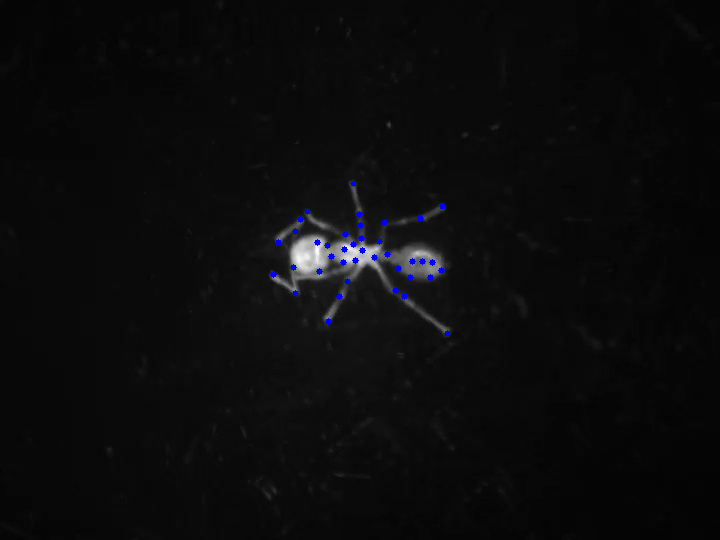

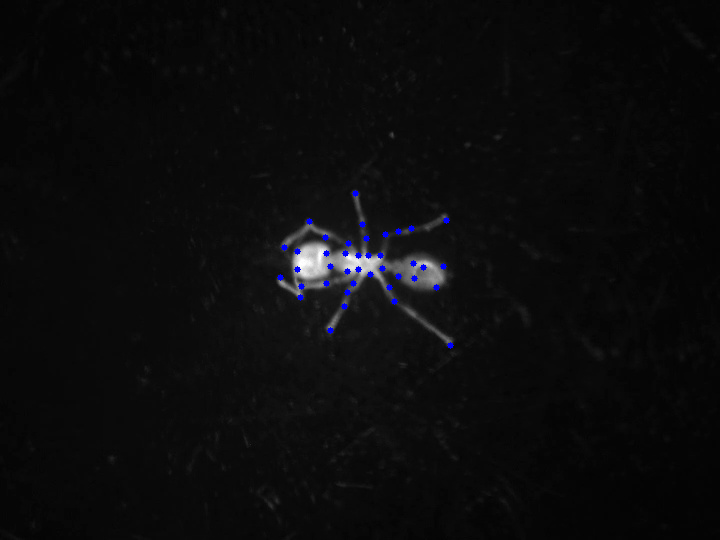

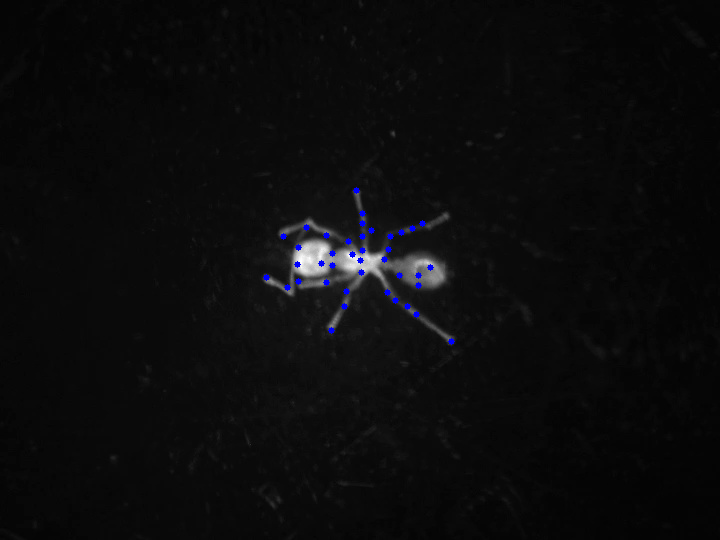

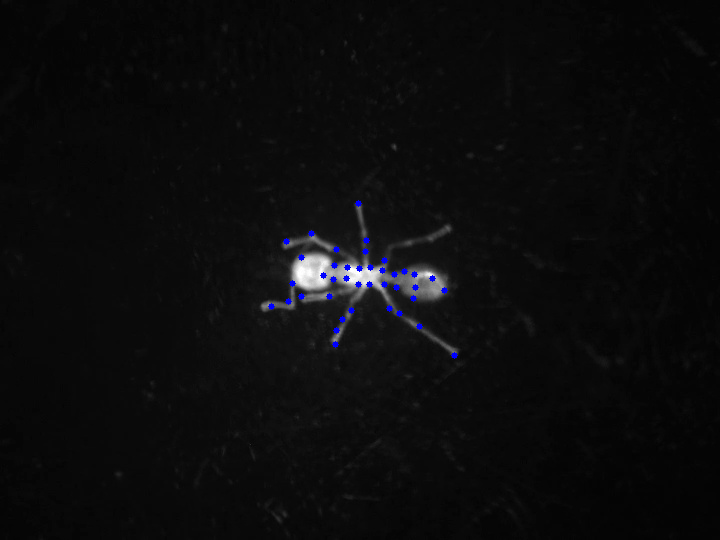

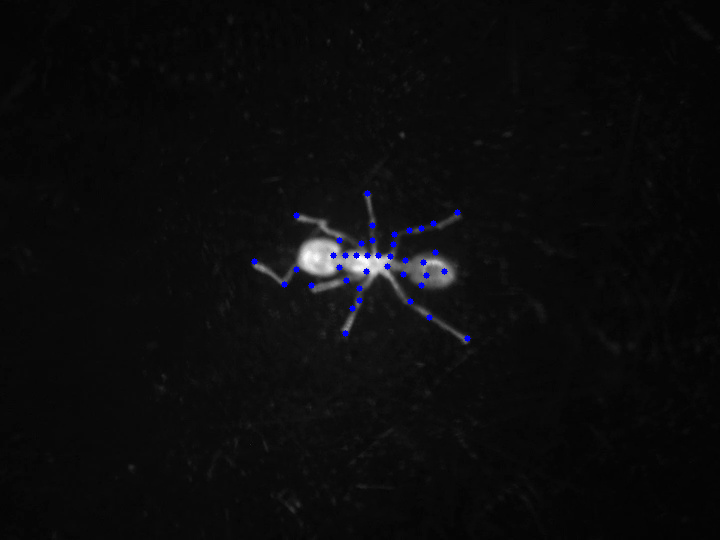

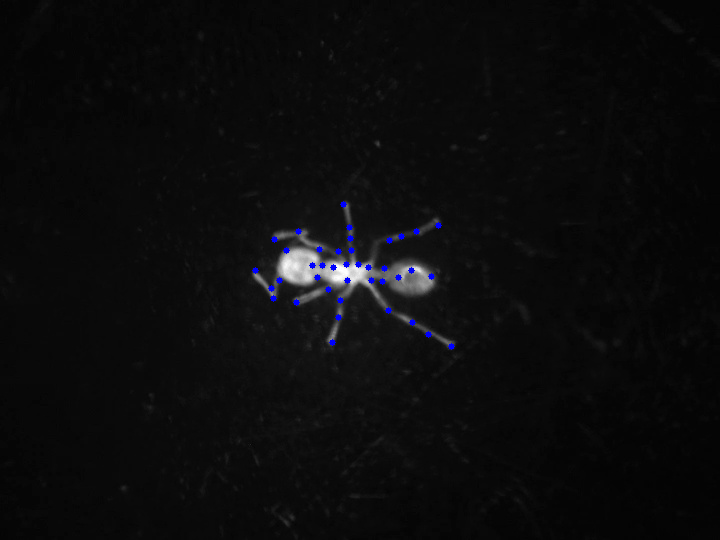

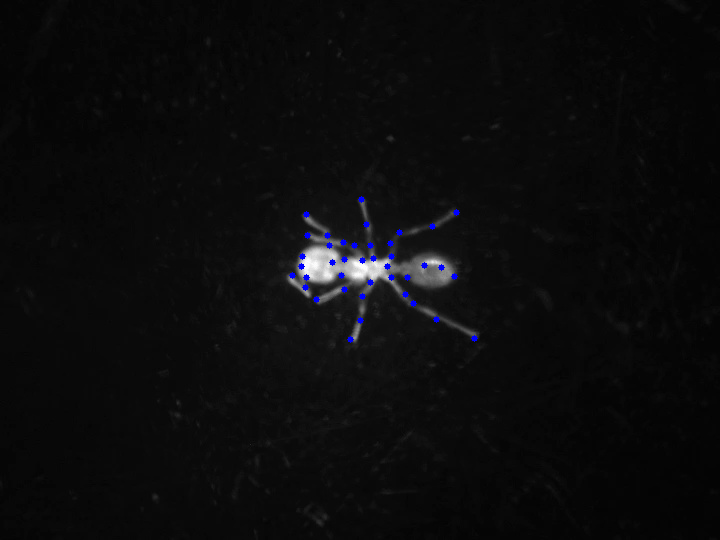

In [ ]:
for i in range(1, 10):
  feature_corners_draw(canny(i), i)

# Skeleton

The image is first binarized using thresholding. Morphological operations like opening and closing are then applied to remove noise and fill gaps in the binary image. Finally, the Zhang-Suen algorithm is used to extract the skeleton by iteratively eroding the image and subtracting it from the original to obtain the skeleton pixels.

In [ ]:
ant_image = cv2.imread('/content/drive/MyDrive/parallel/image' + str(1) + '.jpg', 0)
# Binarize the image using thresholding
_, binary_image = cv2.threshold(ant_image, 50, 255, cv2.THRESH_BINARY)

# Apply morphological operations to remove noise and fill gaps
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

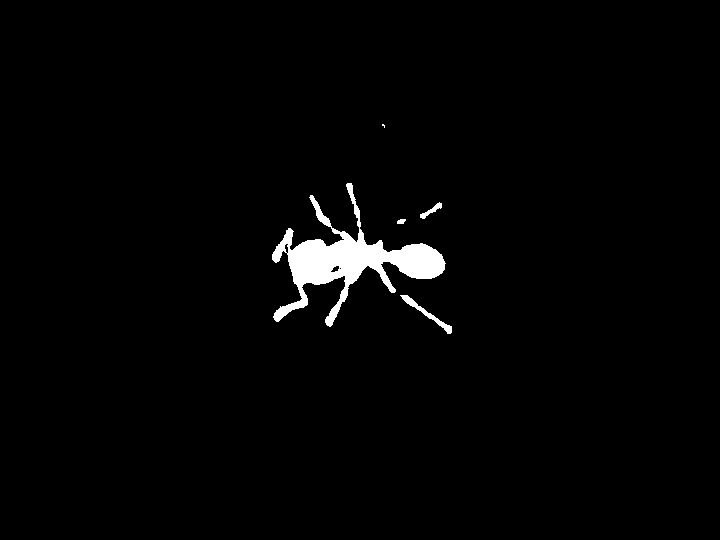

In [ ]:
cv2_imshow(binary_image)

In [ ]:
def skeleton(frame_num):
  ant_image = cv2.imread('/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg', 0)
  # Binarize the image using thresholding
  _, binary_image = cv2.threshold(ant_image, 50, 400, cv2.THRESH_BINARY)

  # Apply morphological operations to remove noise and fill gaps
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
  closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
  skeleton = np.zeros(closing.shape, np.uint8)

  while cv2.countNonZero(closing) > 0:
      eroded = cv2.erode(closing, kernel)
      temp = cv2.dilate(eroded, kernel)
      temp = cv2.subtract(closing, temp)
      skeleton = cv2.bitwise_or(skeleton, temp)
      closing = eroded.copy()
  return skeleton

def draw_skeleton(frame_num):
  corners = canny(frame_num)
  skeleton_1 = skeleton(frame_num)
  for corner in corners:
    x, y = corner.ravel()
    cv2.circle(skeleton_1, (x,y), 3, (255,225,0), -1)
  cv2_imshow(skeleton_1)
  cv2.imwrite('/content/drive/MyDrive/CNN/'+str(i)+'.jpg', skeleton_1)


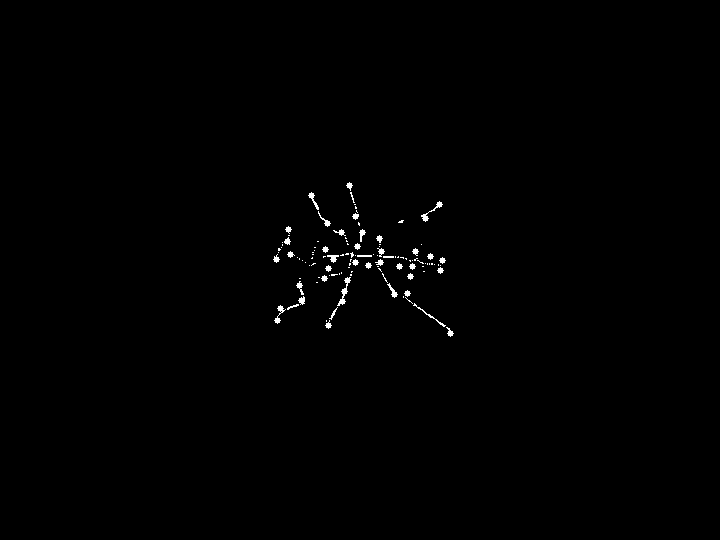

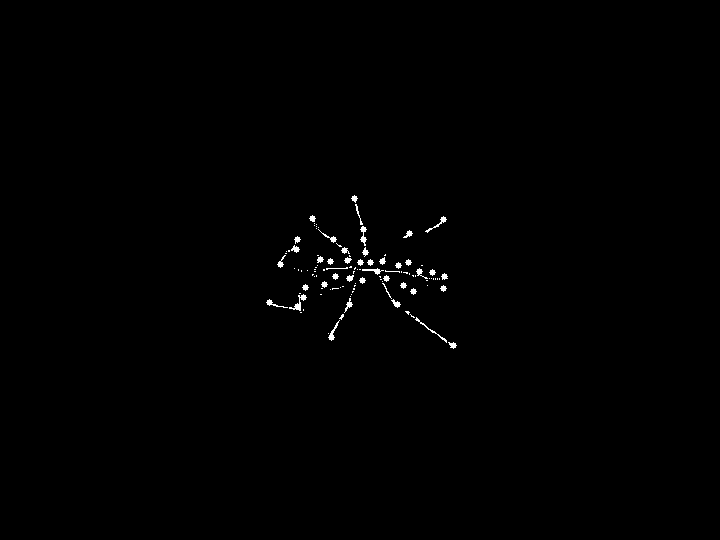

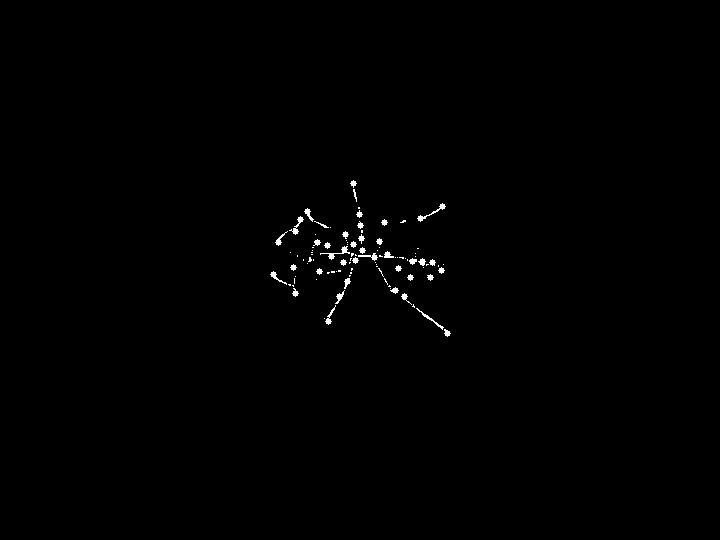

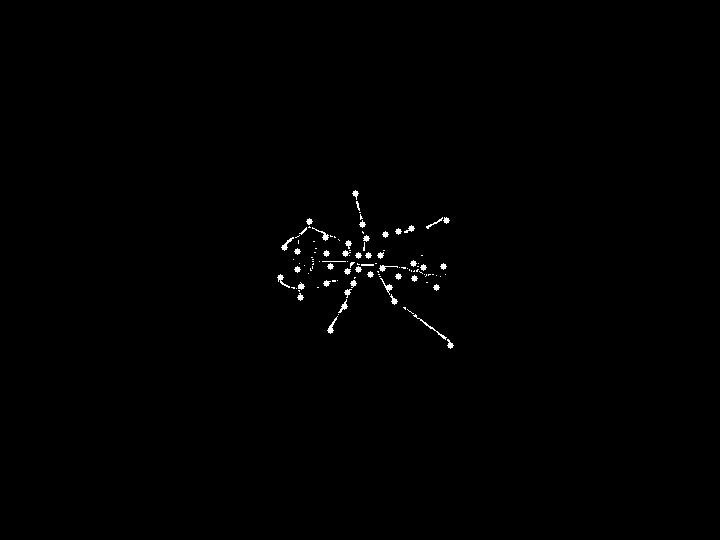

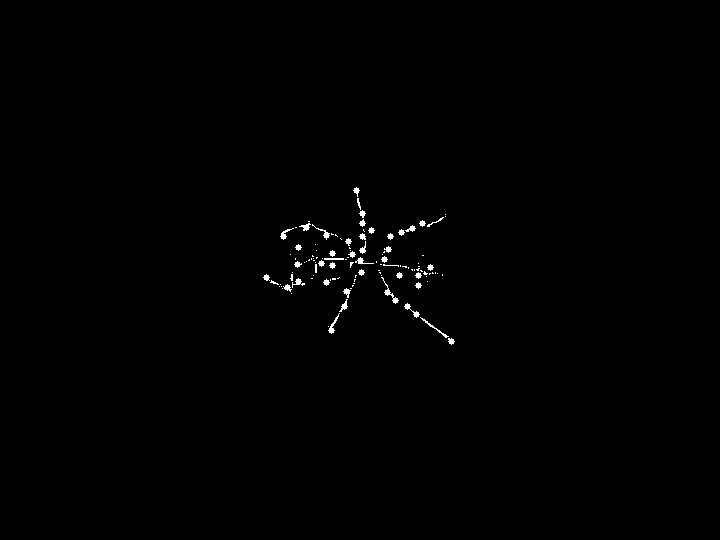

In [ ]:
for i in range(1, 6):
  draw_skeleton(i)

# Cropping for CNN

In [ ]:
def crop_cnn(num):
  a = canny(3)[num][0]
  img = cv2.imread('/content/drive/MyDrive/CNN/3.jpg')
  cv2_imshow(img[a[1]-15:a[1]+15, a[0]-15:a[0]+15])
  t = img[a[1]-15:a[1]+15, a[0]-15:a[0]+15]
  return t

In [ ]:
cv2.imwrite('/content/drive/MyDrive/CNN/connection/' + str(27)+'.jpg', crop_cnn(39))

True

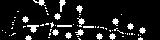

In [ ]:
# /content/drive/MyDrive/CNN
img = cv2.imread('/content/drive/MyDrive/CNN/1.jpg')
cv2_imshow(img[230:270, 300:460])

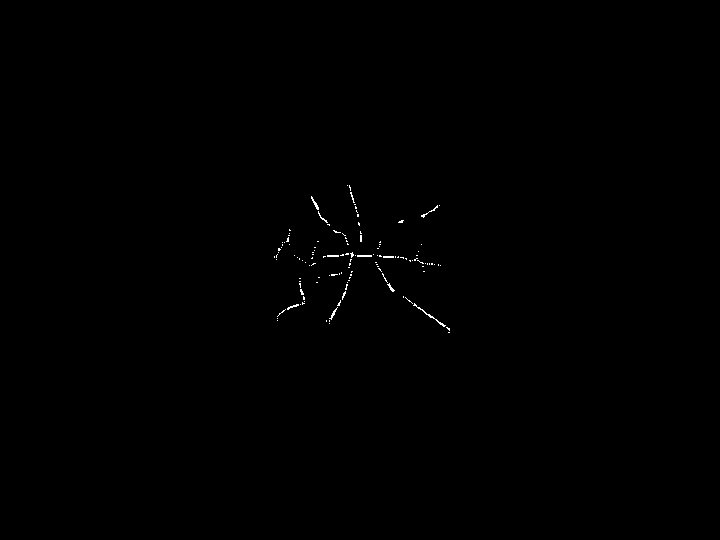

In [ ]:
skeleton = np.zeros(closing.shape, np.uint8)
while cv2.countNonZero(closing) > 0:
    eroded = cv2.erode(closing, kernel)
    temp = cv2.dilate(eroded, kernel)
    temp = cv2.subtract(closing, temp)
    skeleton = cv2.bitwise_or(skeleton, temp)
    closing = eroded.copy()
cv2_imshow(skeleton)
cv2.waitKey(0)
cv2.destroyAllWindows()

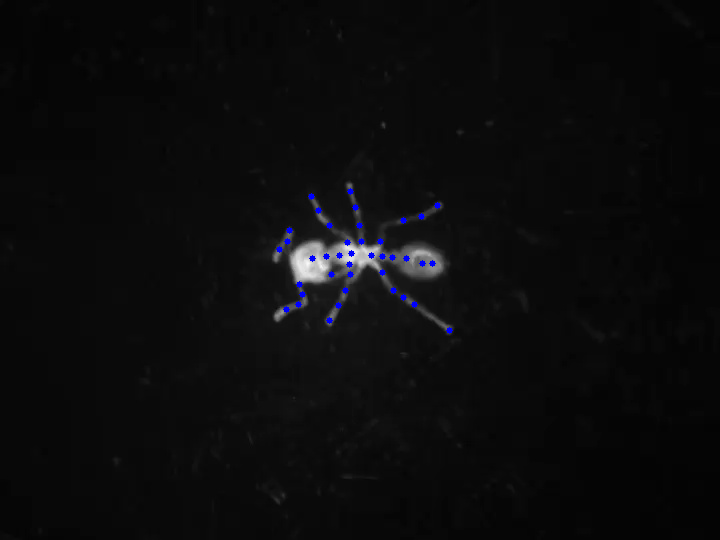

In [ ]:
corners = cv2.goodFeaturesToTrack(skeleton, 40, 0.01, 10)
corners = np.int0(corners)

def feature_corners_draw(corner, img_url,frame_num):
  img = cv2.imread(img_url)
  for corner in corner:
    x, y = corner.ravel()
    cv2.circle(img, (x,y), 3, 255, -1)
  cv2_imshow(img)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

  output_image_path = 'output_image' + str(frame_num) + '.jpg'

feature_corners_draw(corners, '/content/drive/MyDrive/parallel/image' + str(1) + '.jpg', 1)

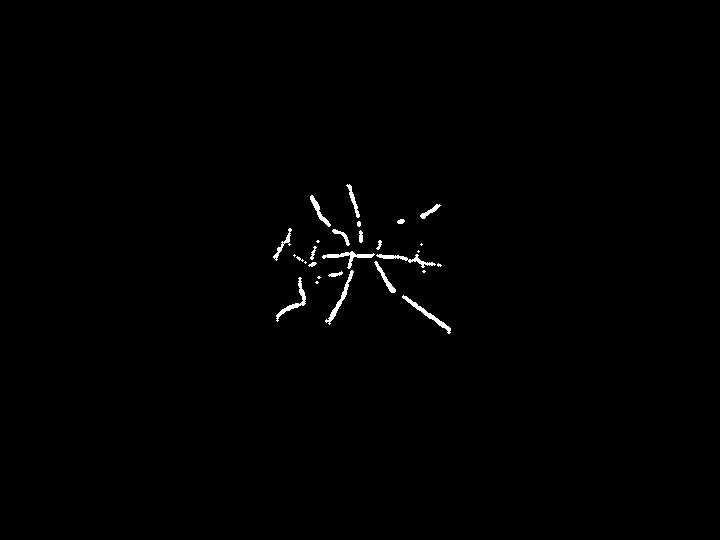

In [ ]:
contours, _ = cv2.findContours(skeleton, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an image to draw the connected lines
lines_image = np.zeros_like(skeleton, np.uint8)

# Draw the contours (lines) on the lines image
cv2.drawContours(lines_image, contours, -1, 255, thickness=2)

cv2_imshow(lines_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Connected Components Labeling

In [ ]:
def skeleton(frame_num):
  ant_image = cv2.imread('/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg', 0)
  # Binarize the image using thresholding
  _, binary_image = cv2.threshold(ant_image, 50, 400, cv2.THRESH_BINARY)

  # Apply morphological operations to remove noise and fill gaps
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
  closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
  skeleton = np.zeros(closing.shape, np.uint8)

  while cv2.countNonZero(closing) > 0:
      eroded = cv2.erode(closing, kernel)
      temp = cv2.dilate(eroded, kernel)
      temp = cv2.subtract(closing, temp)
      skeleton = cv2.bitwise_or(skeleton, temp)
      closing = eroded.copy()
  return skeleton

def draw_skeleton(frame_num):
  skeleton_1 = skeleton(frame_num)
  cv2_imshow(skeleton_1)
  cv2.waitKey(0)
  cv2.destroyAllWindows()


In [ ]:
skeleton(3)
retval, labels, stats, centroids = cv2.connectedComponentsWithStats(skeleton(1))
labels

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

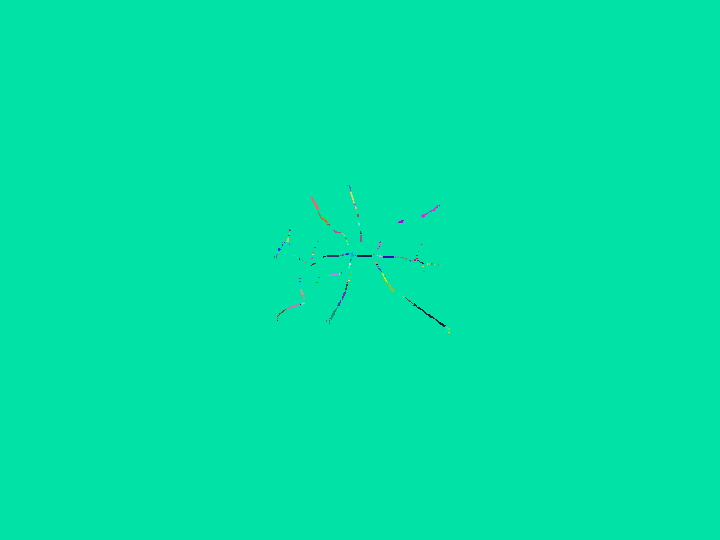

In [ ]:
import cv2
import numpy as np

# Generate a random color map for visualization
colors = np.random.randint(0, 255, size=(np.max(labels) + 1, 3), dtype=np.uint8)
# Create a colored visualization image
visualization_image = colors[labels]
# Display the visualization image
cv2_imshow(visualization_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

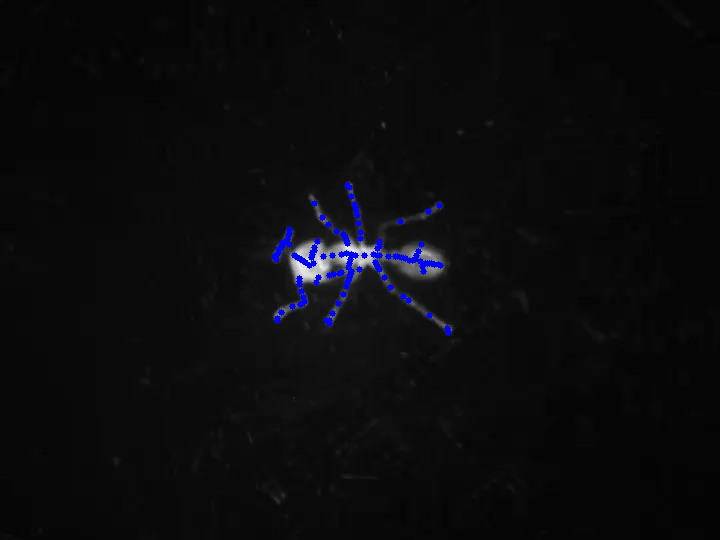

In [ ]:
img_url = '/content/drive/MyDrive/parallel/image' + str(1) + '.jpg'
img = cv2.imread(img_url)
for i in range(len(centroids)):
  cv2.circle(img, (int(centroids[i][0]), int(centroids[i][1])), 3, 255, -1)
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()

output_image_path = 'output_image' + str(1) + '.jpg'


# Template matching

### Use Cropping method to select ROI(region of interest)

<class 'numpy.ndarray'>
Shape of the image (540, 720, 3)


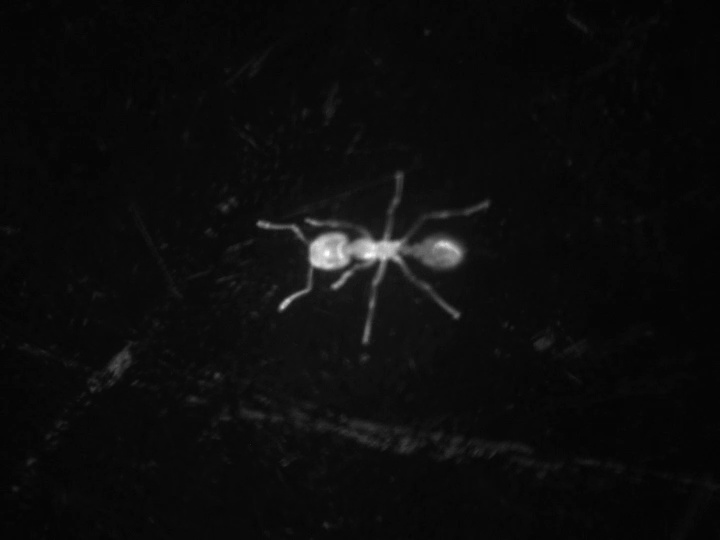

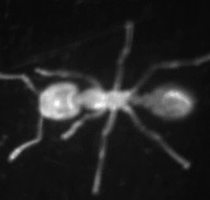

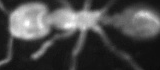

In [ ]:
import cv2

img = cv2.imread('/content/drive/MyDrive/parallel/image' + str(100) + '.jpg')
print(type(img))

# Shape of the image
print("Shape of the image", img.shape)

# [rows, columns]
# here x is y, y is x
# crop_whole = img[150:350, 270:480]
# crop_body = img[230:280, 300:460]

crop_whole = img[150:350, 270:480]
crop_body = img[230:300, 300:460]

cv2_imshow(img)
cv2_imshow(crop_whole)
cv2_imshow(crop_body)
cv2.waitKey(0)
cv2.destroyAllWindows()

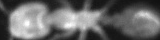

In [ ]:
crop_body = img[230:270, 300:460]
cv2_imshow(crop_body)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
cv2.imwrite('template.jpg', crop_body)

True

In [ ]:
import cv2
import numpy as np

def label_parts_with_template(target_image, template_image, threshold):
    # Convert images to grayscale
    target_gray = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)
    template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)

    # Perform template matching
    result = cv2.matchTemplate(target_gray, template_gray, cv2.TM_CCOEFF_NORMED)

    # Apply threshold to identify matching regions
    matches = np.where(result >= threshold)

    # Draw rectangles around the matching regions
    for pt in zip(*matches[::-1]):
        bottom_right = (pt[0] + template_image.shape[1], pt[1] + template_image.shape[0])
        cv2.rectangle(target_image, pt, bottom_right, (0, 255, 0), 2)

    return target_image

def draw_match_part(frame_number):
  # Load the target image and template image
  target_image = cv2.imread('/content/drive/MyDrive/parallel/image' + str(frame_number) + '.jpg')
  template_image = cv2.imread('template.jpg')

  # Set the threshold value for template matching
  threshold = 0.6

  # Label the parts similar to the template
  labeled_image = label_parts_with_template(target_image, template_image, threshold)

  # Display the labeled image
  cv2_imshow(labeled_image)
  cv2.waitKey(0)
  cv2.destroyAllWindows()


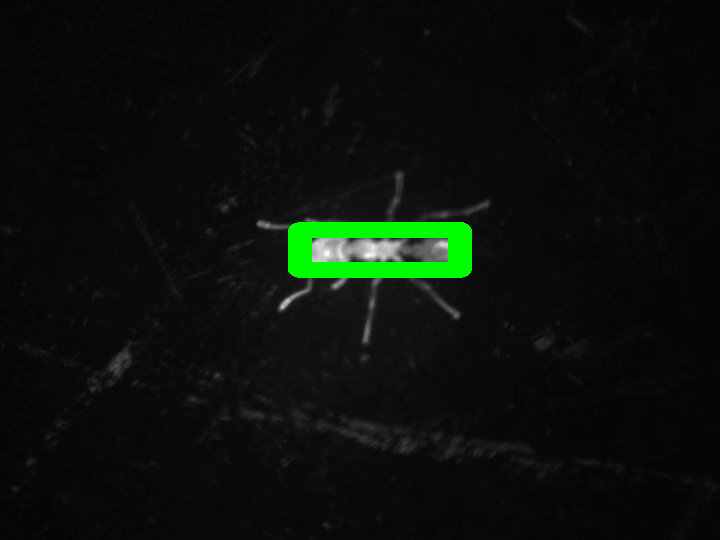

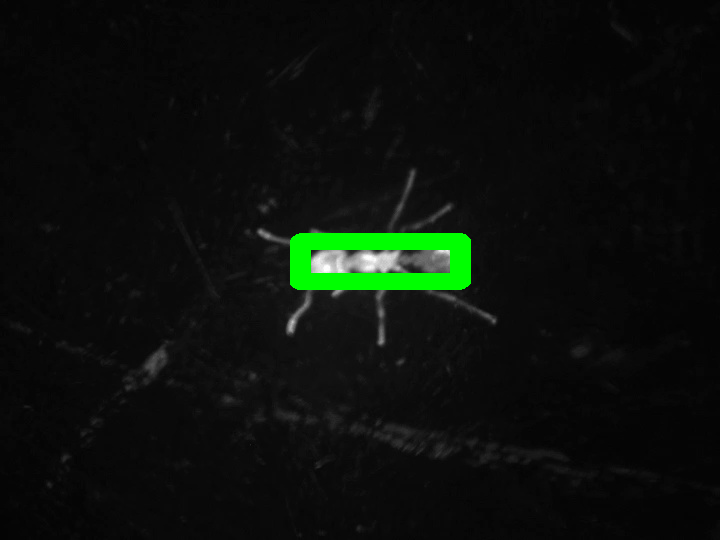

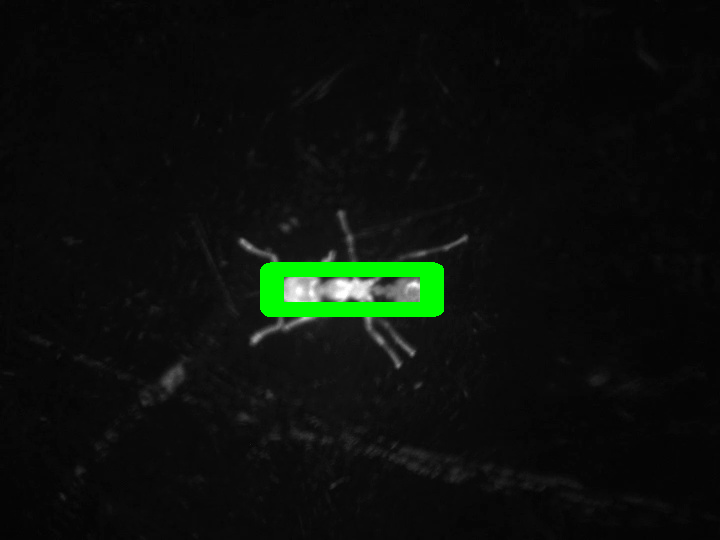

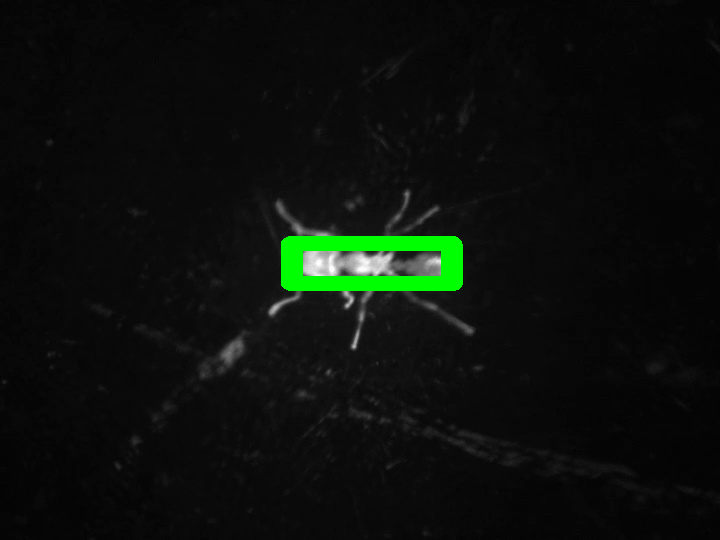

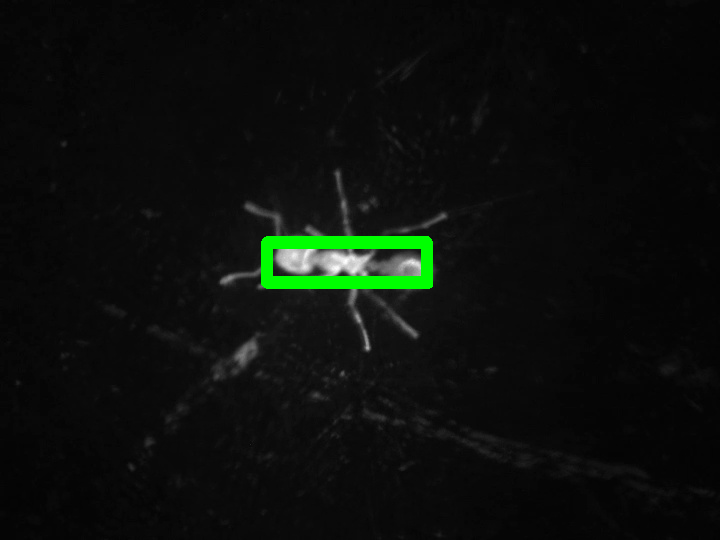

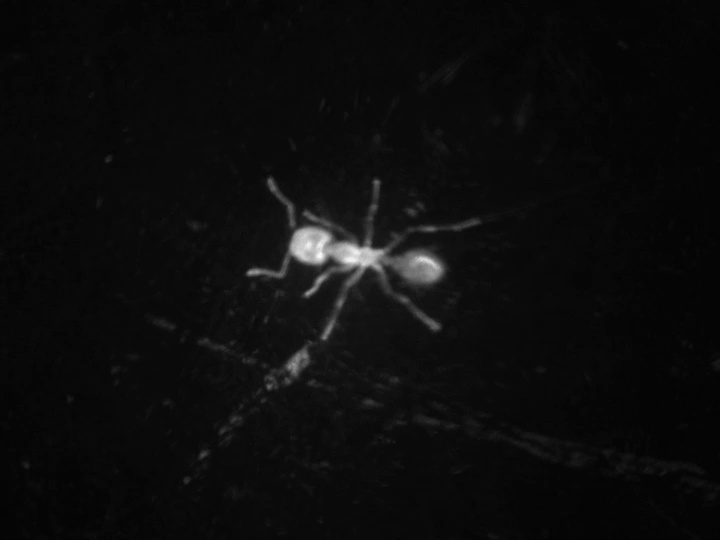

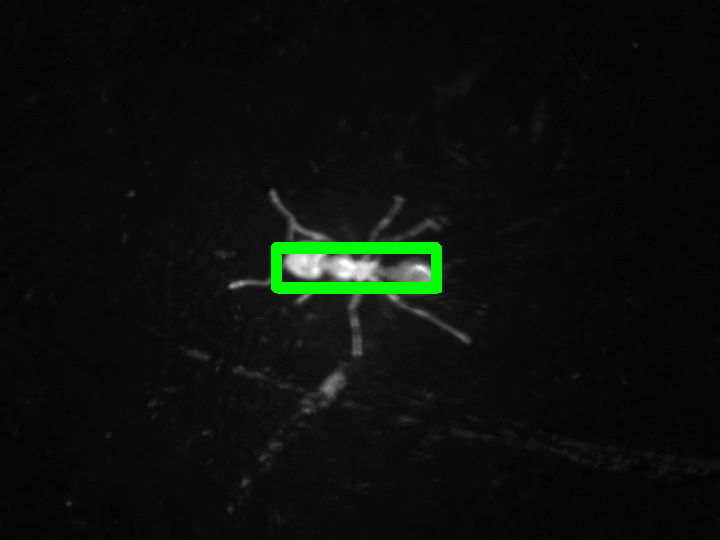

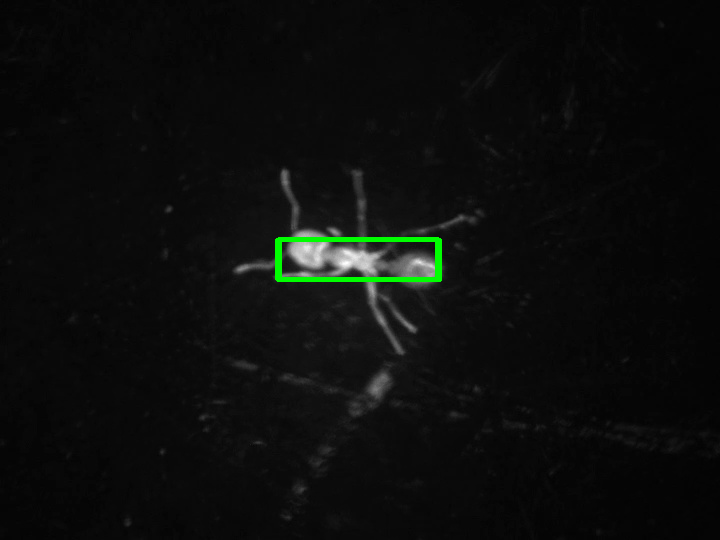

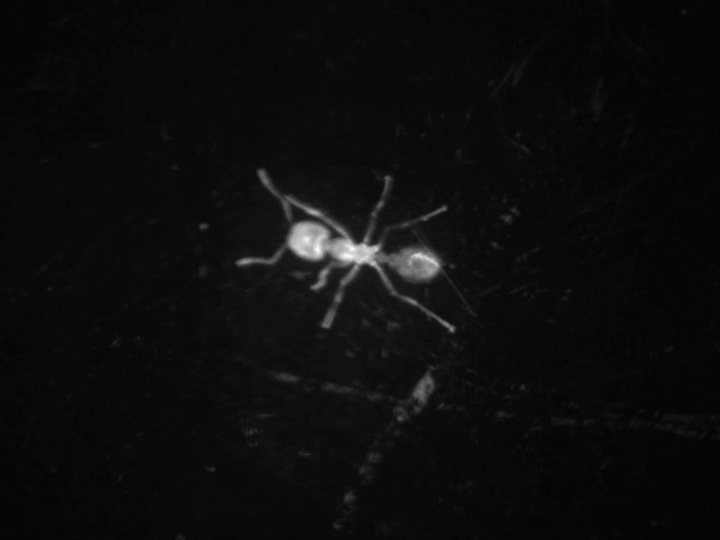

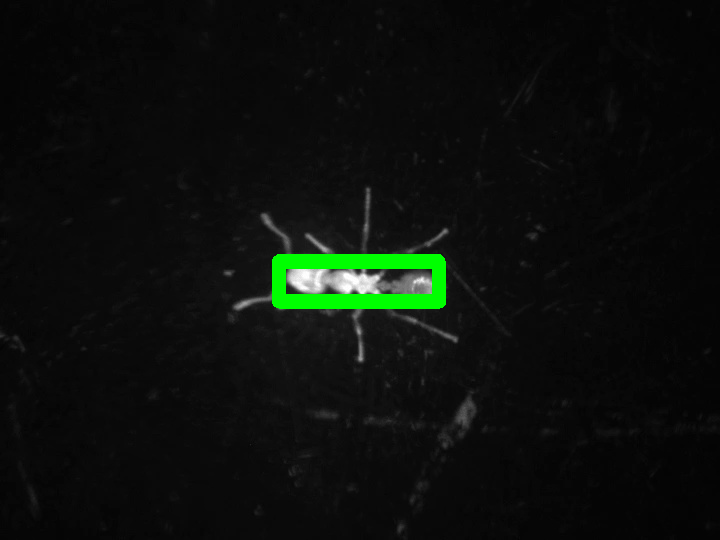

In [ ]:
for i in range(100, 110):
  draw_match_part(i)

## Remove the matched part

In [ ]:
import cv2
import numpy as np

def template_part_removal(target_image, template_image, threshold):
    # Convert images to grayscale
    target_gray = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)
    template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)

    # Perform template matching
    result = cv2.matchTemplate(target_gray, template_gray, cv2.TM_CCOEFF_NORMED)

    # Apply threshold to identify matching regions
    matches = np.where(result >= threshold)

    # Create a mask to exclude the matched regions
    mask = np.zeros_like(target_image)

    # Draw rectangles on the mask for the matched regions
    for pt in zip(*matches[::-1]):
        bottom_right = (pt[0] + template_image.shape[1], pt[1] + template_image.shape[0])
        cv2.rectangle(mask, pt, bottom_right, (255, 255, 255), cv2.FILLED)

    # Apply the mask to remove the matched regions
    result_image = cv2.bitwise_and(target_image, cv2.bitwise_not(mask))

    return result_image


def draw_template_removed(frame_number):
  # Load the target image and template image
  target_image = cv2.imread('/content/drive/MyDrive/parallel/image' + str(frame_number) + '.jpg')
  template_image = cv2.imread('template.jpg')

  # Set the threshold value for template matching
  threshold = 0.7

  # Label the parts similar to the template and remove them
  result_image = template_part_removal(target_image, template_image, threshold)

  # Display the result image
  cv2_imshow(result_image)
  cv2.waitKey(0)
  cv2.destroyAllWindows()


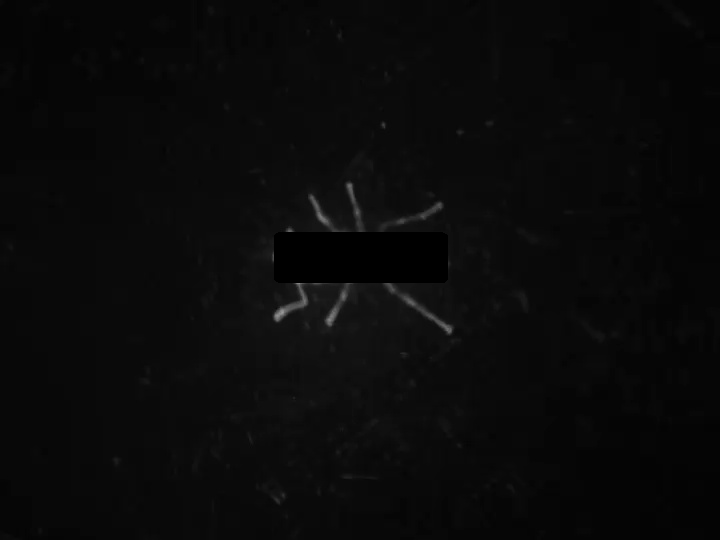

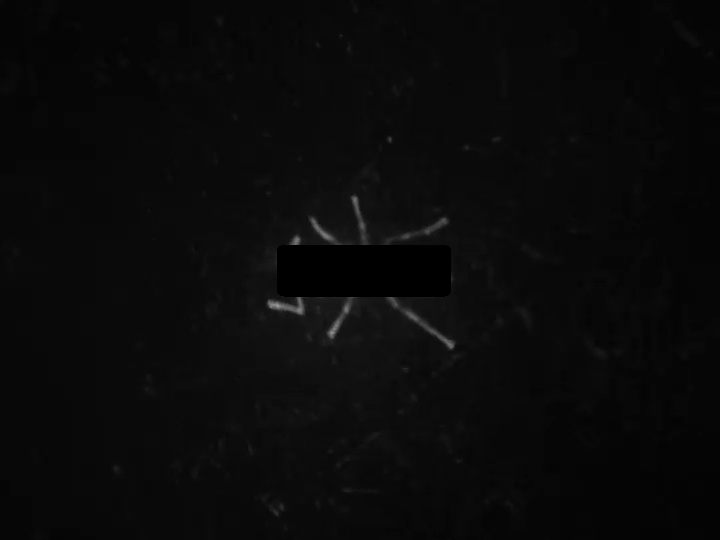

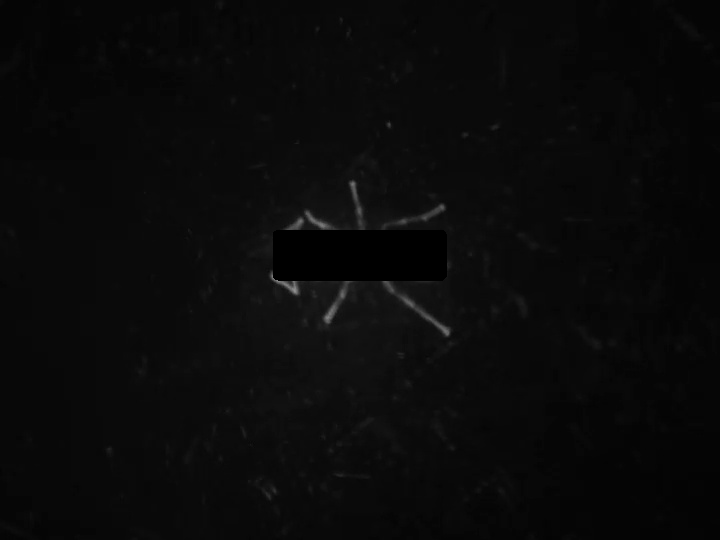

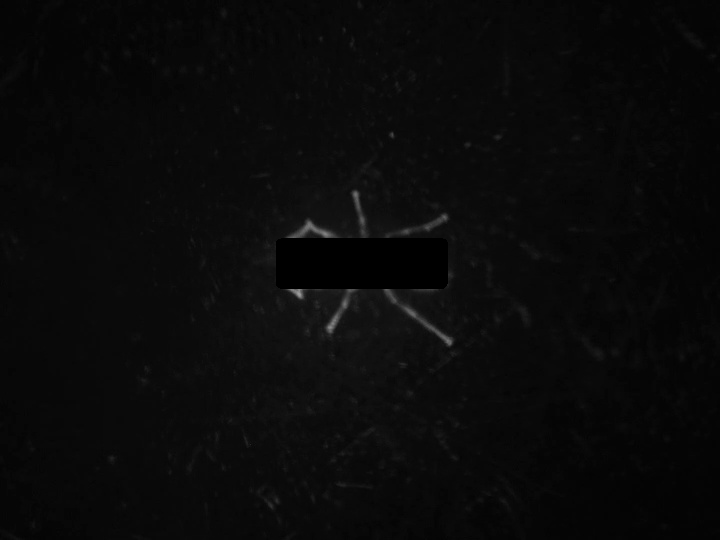

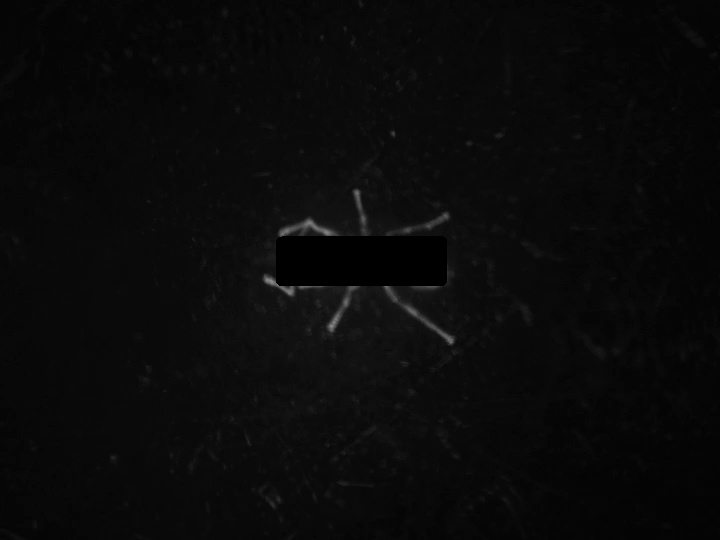

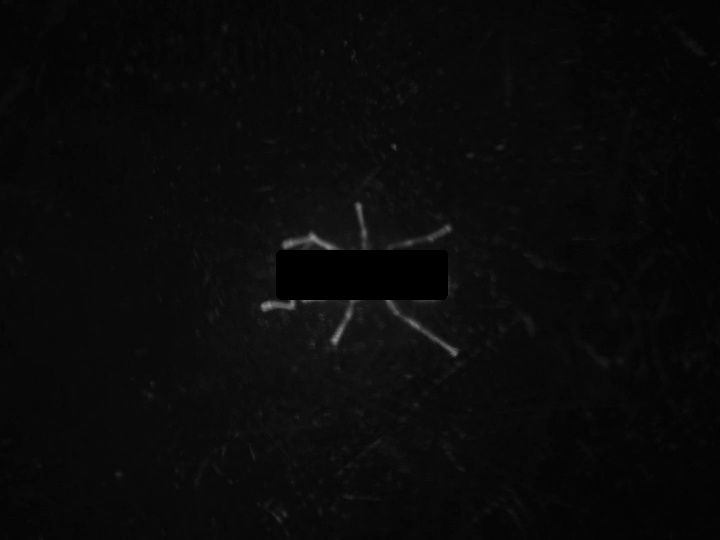

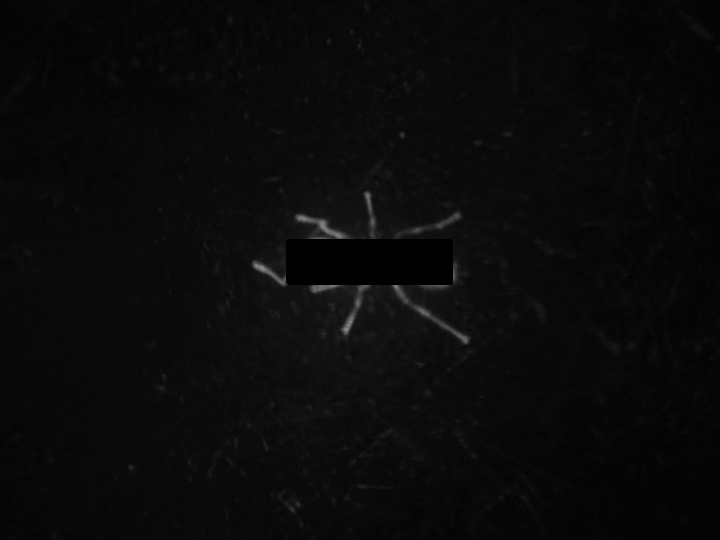

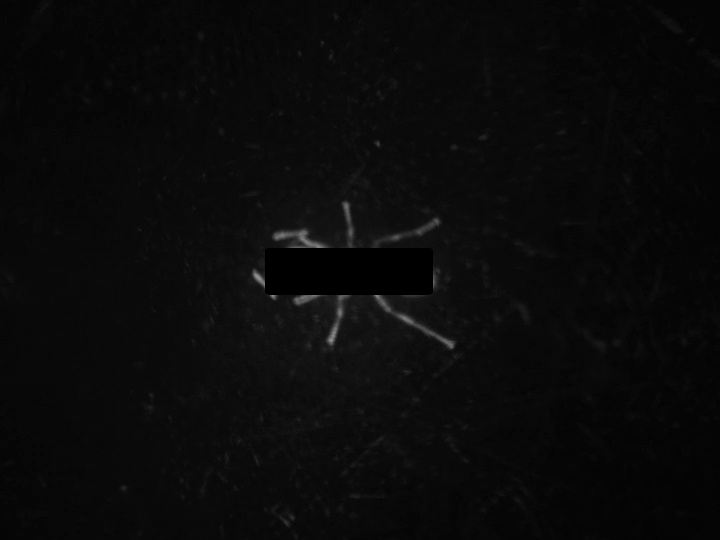

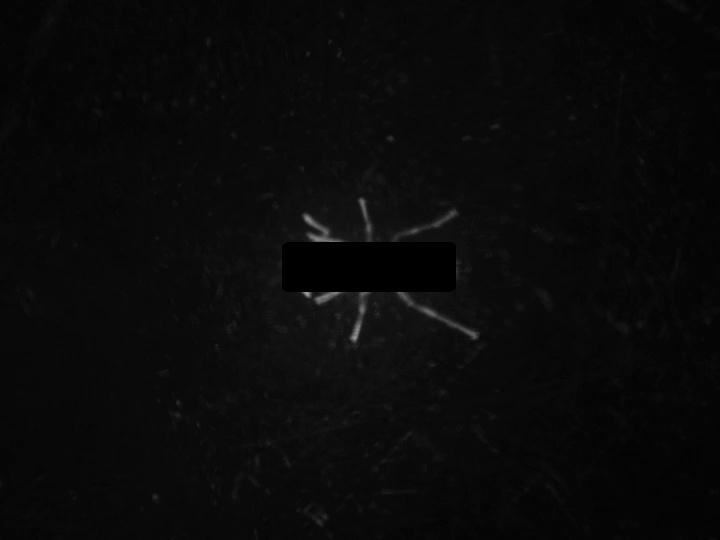

In [ ]:
for i in range(1, 10):
  draw_template_removed(i)

In [ ]:
def skeleton_removed_main_body(frame_number):

  target_image = cv2.imread('/content/drive/MyDrive/parallel/image' + str(frame_number) + '.jpg')
  template_image = cv2.imread('template.jpg')
  # Set the threshold value for template matching
  threshold = 0.7
  # Label the parts similar to the template and remove them
  result_image = template_part_removal(target_image, template_image, threshold)


  result_image = np.mean(result_image, axis=2).astype(np.uint8)
  # Binarize the image using thresholding
  _, binary_image = cv2.threshold(result_image, 50, 255, cv2.THRESH_BINARY)

  # Apply morphological operations to remove noise and fill gaps
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
  closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
  skeleton = np.zeros(closing.shape, np.uint8)

  while cv2.countNonZero(closing) > 0:
    eroded = cv2.erode(closing, kernel)
    temp = cv2.dilate(eroded, kernel)
    temp = cv2.subtract(closing, temp)
    skeleton = cv2.bitwise_or(skeleton, temp)
    closing = eroded.copy()
  return skeleton

def draw_skeleton_removed_main_body(frame_number):
  # Display the skeleton image
  skeleton = skeleton_removed_main_body(frame_number)
  cv2_imshow(skeleton)
  cv2.waitKey(0)
  cv2.destroyAllWindows()


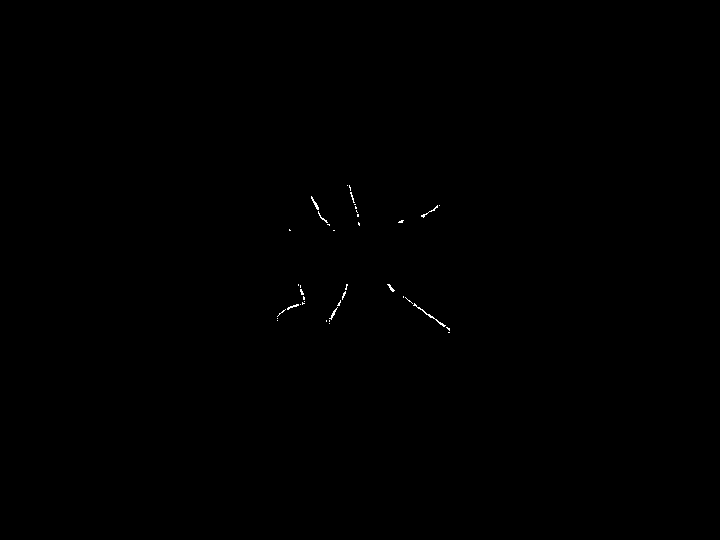

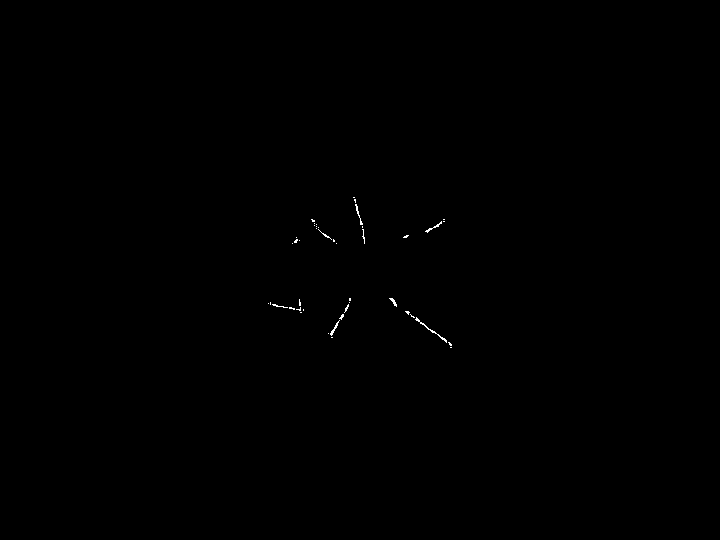

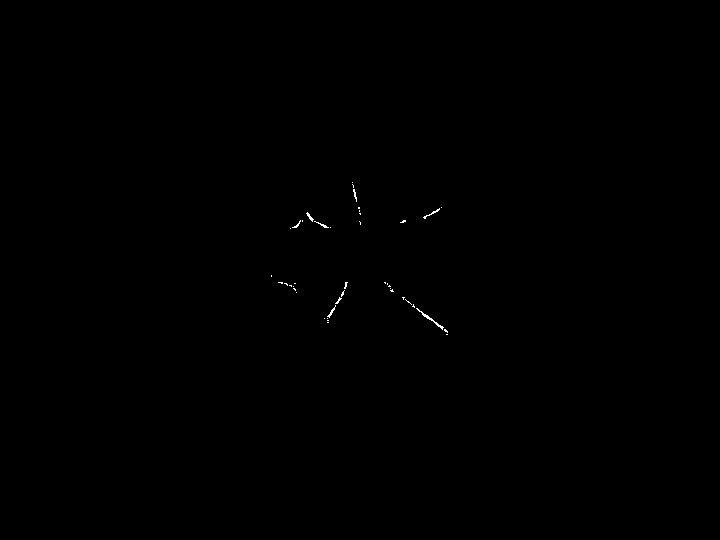

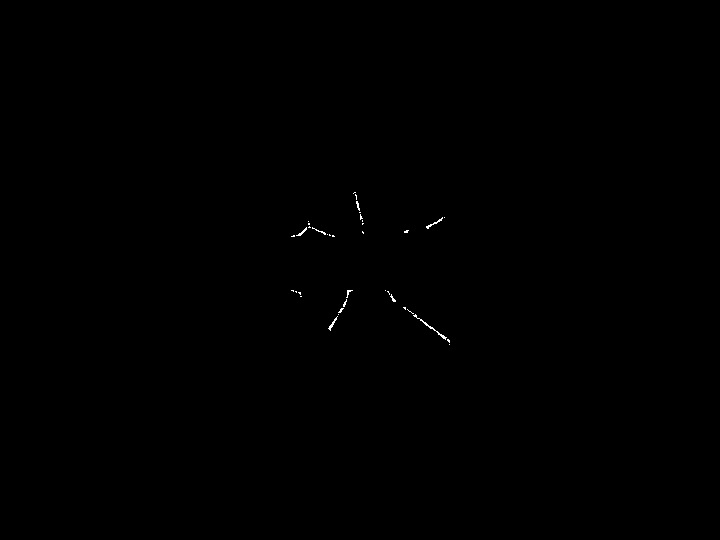

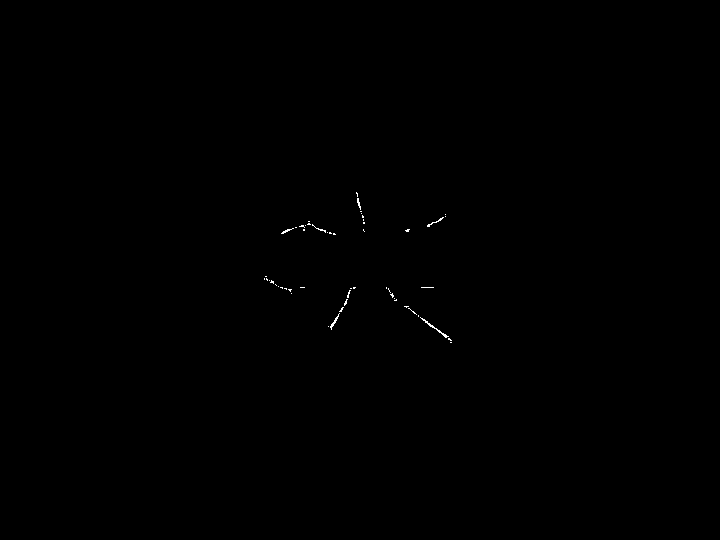

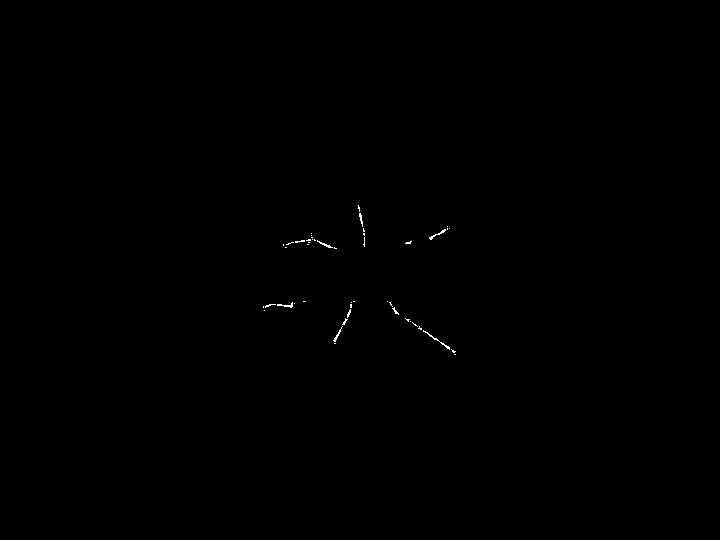

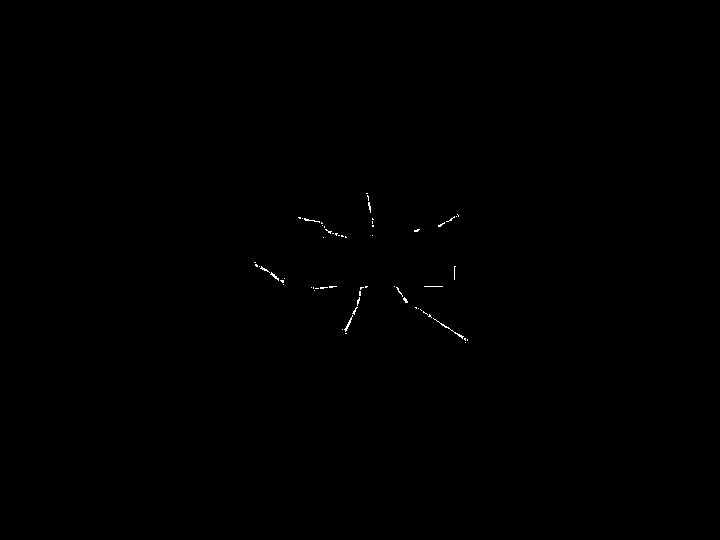

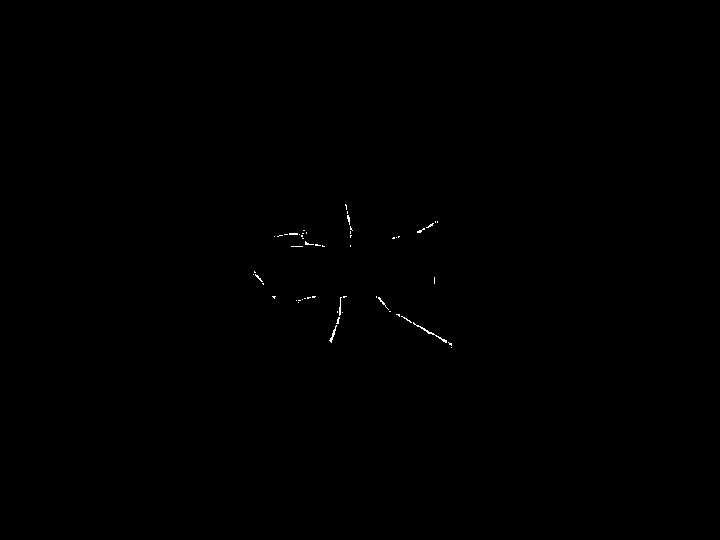

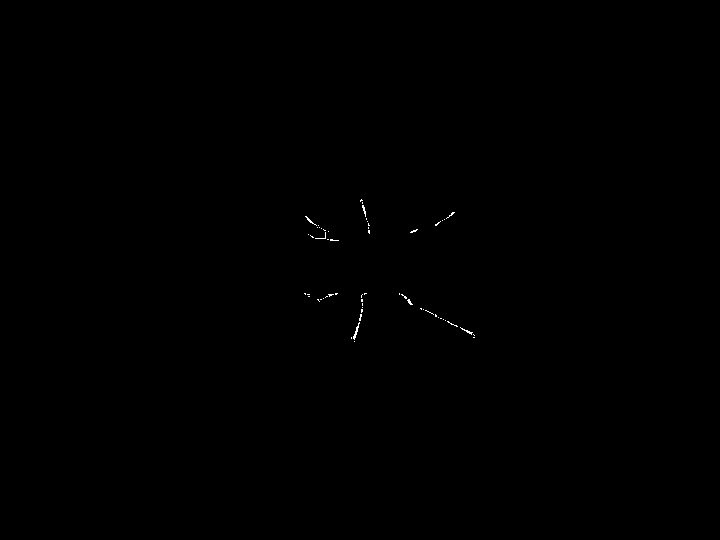

In [ ]:
for i in range(1, 10):
  draw_skeleton_removed_main_body(i)

## Good feature to Track

In [ ]:
def GFTT_after_removed_main_body(frame_number):
  skeleton = skeleton_removed_main_body(frame_number)
  corners = cv2.goodFeaturesToTrack(skeleton, 40, 0.01, 10)
  corners = np.int0(corners)
  return corners

def feature_corners_draw(corner,frame_num):
  img_url = '/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg'
  img = cv2.imread(img_url)
  for corner in corner:
    x, y = corner.ravel()
    cv2.circle(img, (x,y), 3, 255, -1)
  cv2_imshow(img)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

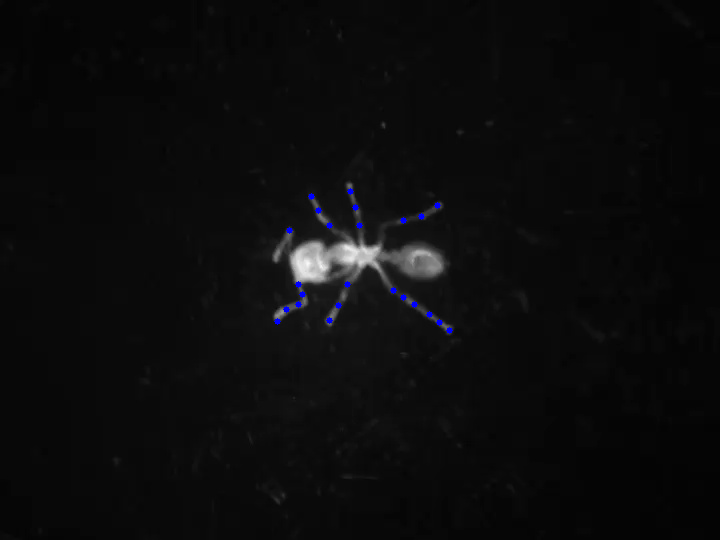

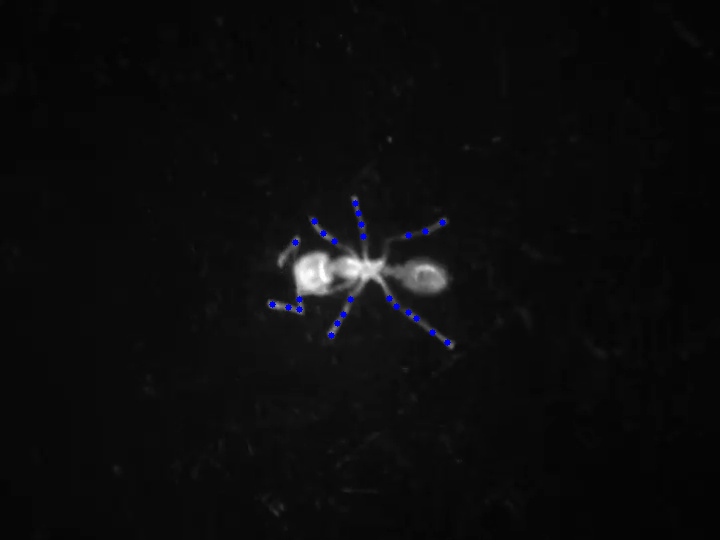

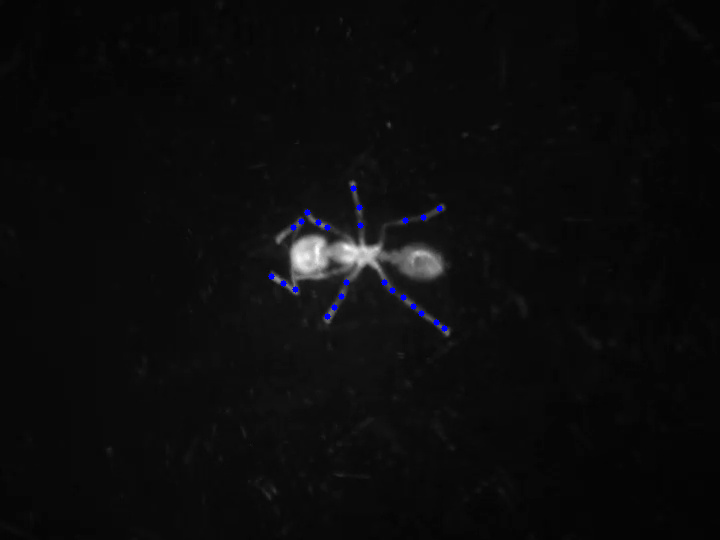

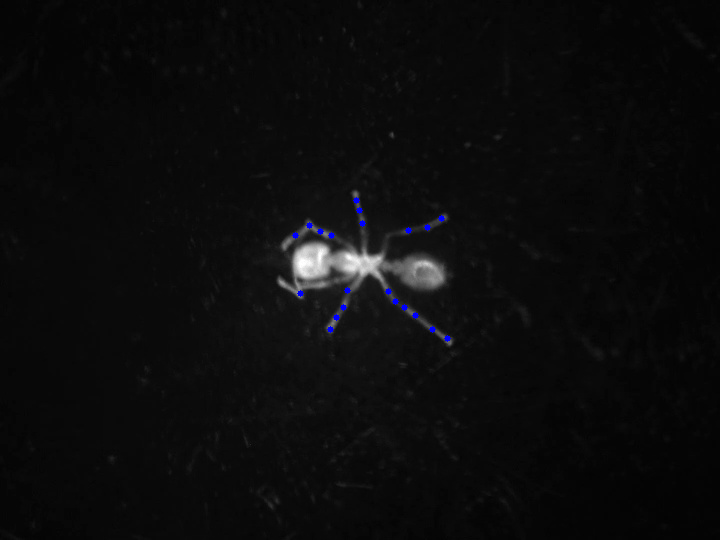

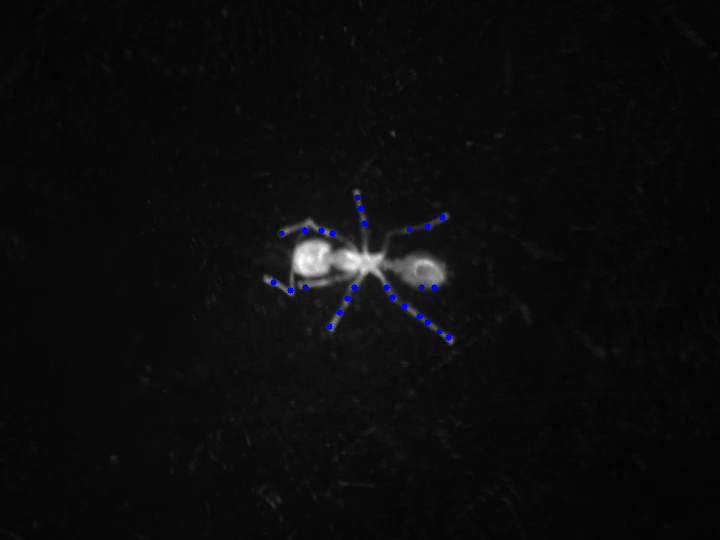

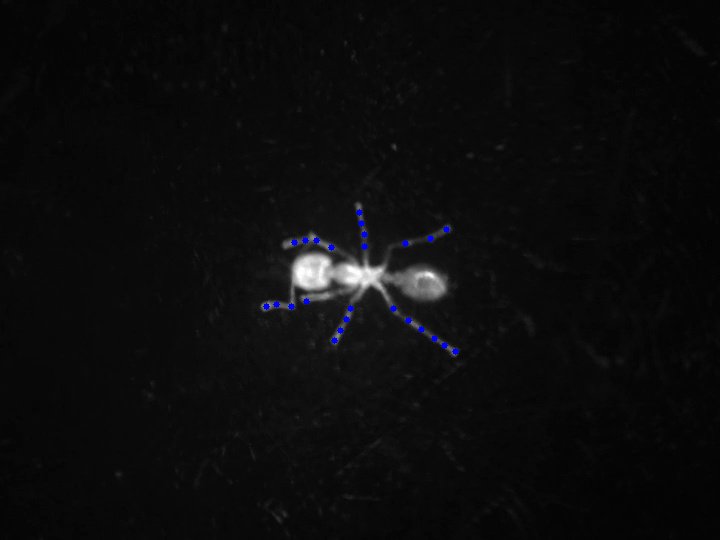

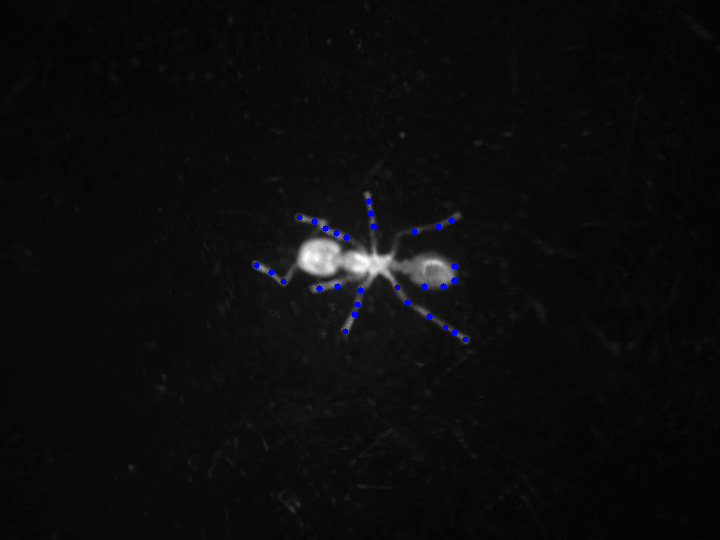

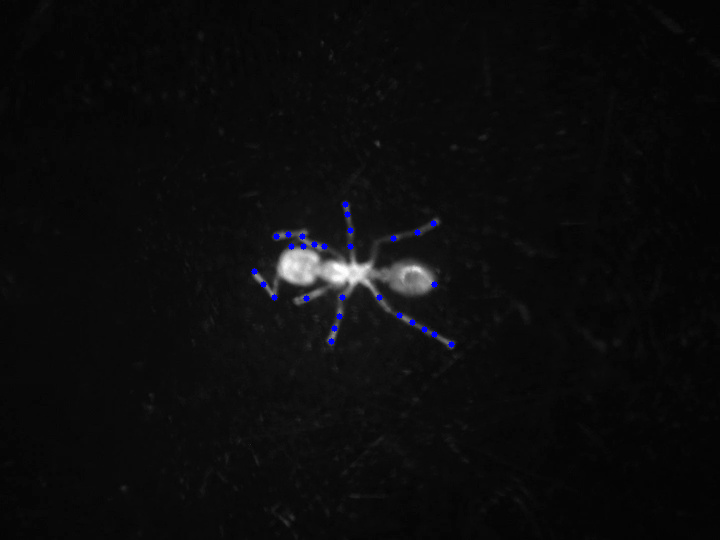

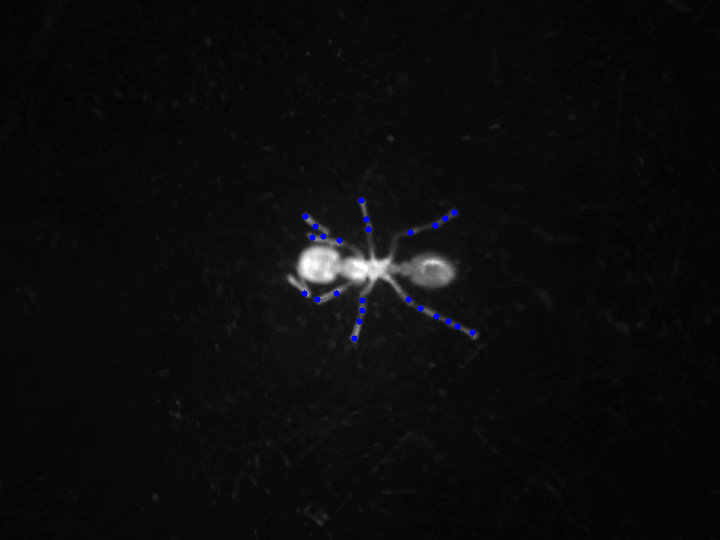

In [ ]:
for i in range(1, 10):
  feature_corners_draw(GFTT_after_removed_main_body(i), i)

In [ ]:
def GFTT1(frame_num):
  image_width = 720
  image_height = 540
  num_channels = 3  # 3 for color image (BGR)
  # Create a blank image filled with zeros
  blank_image = np.zeros((image_height, image_width, num_channels), dtype=np.uint8)
  img_url = '/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg'
  img = cv2.imread(img_url)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  gray = np.float32(gray)
  corners = cv2.goodFeaturesToTrack(gray, 40, 0.01, 10) #the number 40 here controls how many corners to show
  corners = np.int0(corners)
  for corner in corners:
      x, y = corner.ravel()
      cv2.circle(blank_image, (x,y), 3, 255, -1)
  output_path = "output"+str(frame_num)+".jpg"  # Specify the desired output path and filename
  cv2.imwrite(output_path, blank_image)
  return output_path

In [ ]:
GFTT1(2)

'output2.jpg'

In [ ]:
def GFTT1_skeleton(frame_num, output_path):
  ant_image = cv2.imread(GFTT1(frame_num), 0)
  # Binarize the image using thresholding
  _, binary_image = cv2.threshold(ant_image, 0, 400, cv2.THRESH_BINARY)

  # Apply morphological operations to remove noise and fill gaps
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
  closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
  skeleton = np.zeros(closing.shape, np.uint8)

  while cv2.countNonZero(closing) > 0:
      eroded = cv2.erode(closing, kernel)
      temp = cv2.dilate(eroded, kernel)
      temp = cv2.subtract(closing, temp)
      skeleton = cv2.bitwise_or(skeleton, temp)
      closing = eroded.copy()
  return skeleton

def draw_GFTT1_skeleton(frame_num):
  skeleton_1 = GFTT1_skeleton(frame_num, GFTT1(frame_num))
  cv2_imshow(skeleton_1)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

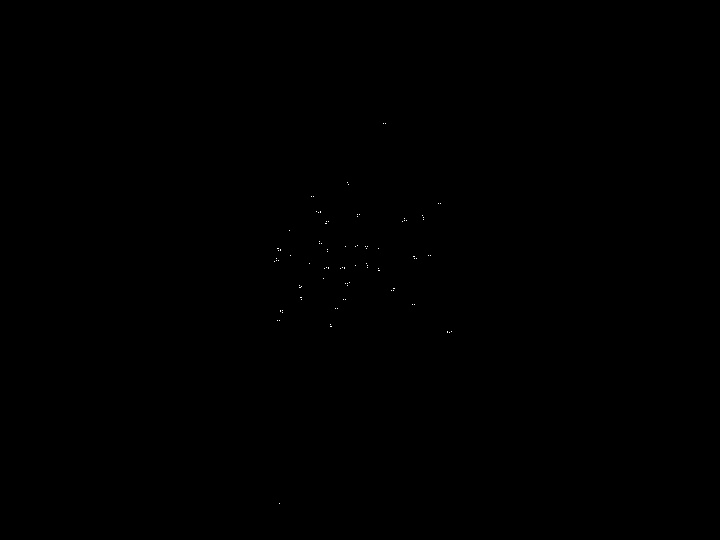

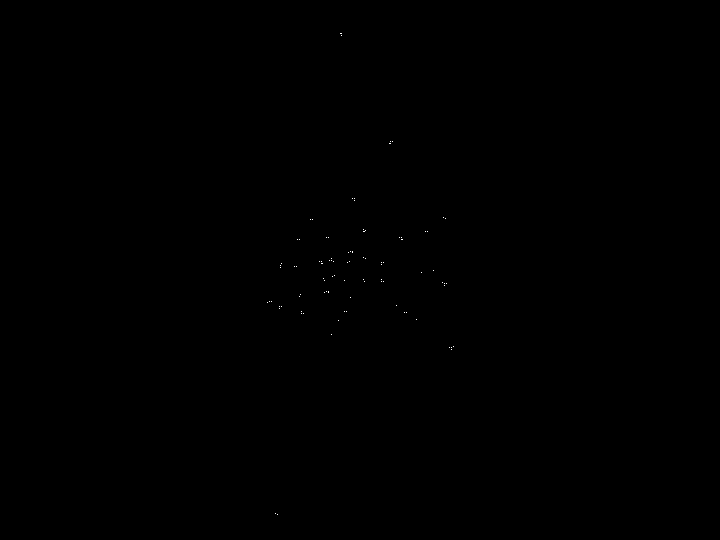

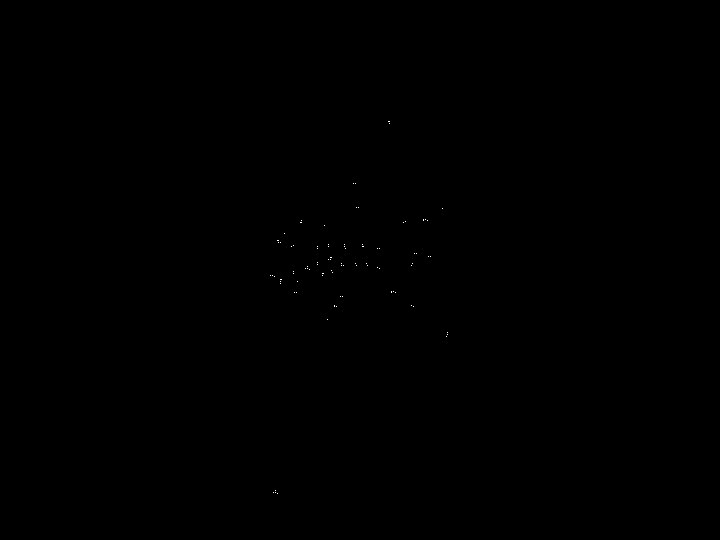

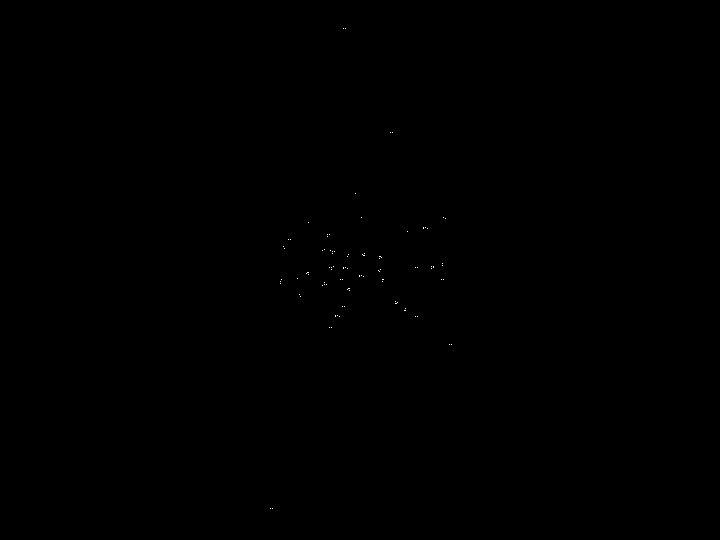

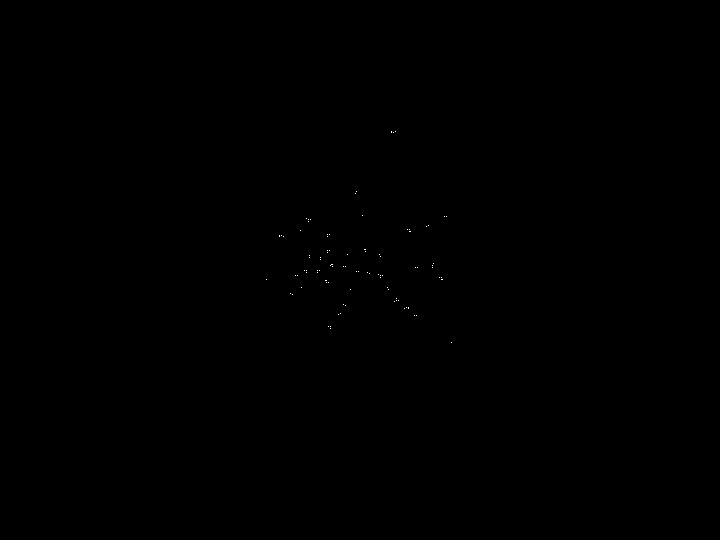

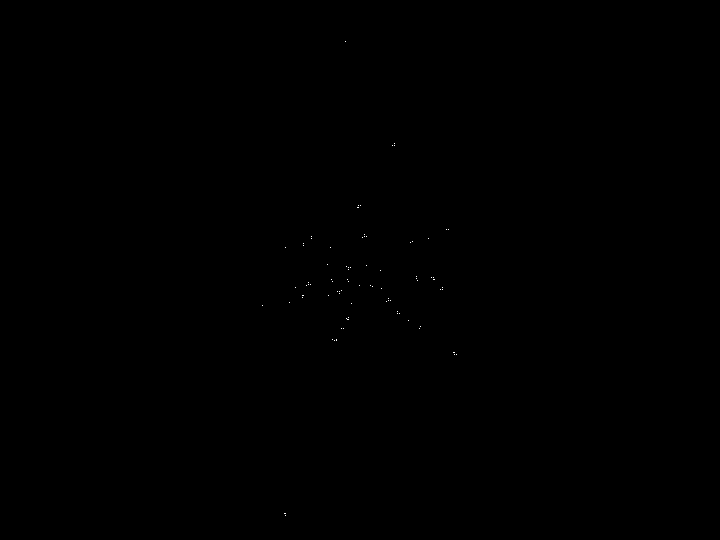

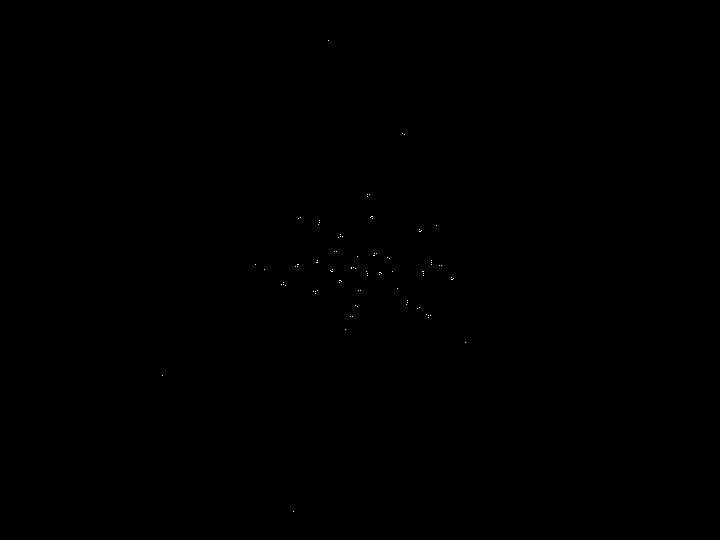

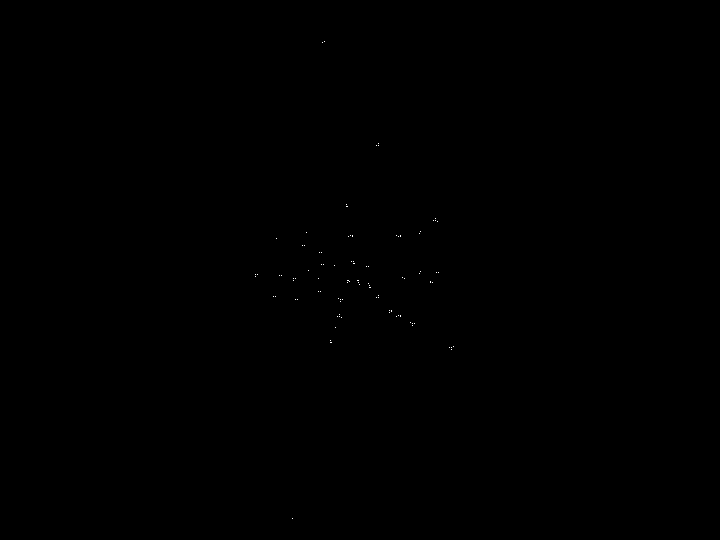

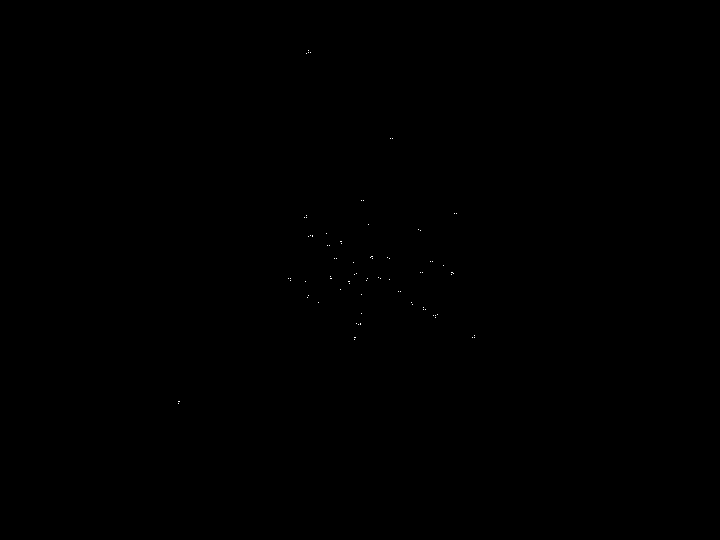

In [ ]:
for i in range(1, 10):
  draw_GFTT1_skeleton(i)

###Find skeleton on images after Good Feature to Track -- without remove the main body part using template matching + on a blank image background

In [ ]:
def GFTT2(frame_number):
  image_width = 720
  image_height = 540
  num_channels = 3  # 3 for color image (BGR)
  # Create a blank image filled with zeros
  blank_image = np.zeros((image_height, image_width, num_channels), dtype=np.uint8)
  skeleton = skeleton_removed_main_body(frame_number)
  corners = cv2.goodFeaturesToTrack(skeleton, 40, 0.01, 10)
  corners = np.int0(corners)
  img_url = '/content/drive/MyDrive/parallel/image' + str(frame_number) + '.jpg'
  #img = cv2.imread(img_url)
  img = blank_image
  for corner in corners:
    x, y = corner.ravel()
    cv2.circle(img, (x,y), 3, 255, -1)
  output_path = "output++"+str(frame_number)+".jpg"  # Specify the desired output path and filename
  cv2.imwrite(output_path, img)
  return output_path

def GFTT2_skeleton(frame_num, output_path):
  ant_image = cv2.imread(GFTT2(frame_num), 0)
  # Binarize the image using thresholding
  _, binary_image = cv2.threshold(ant_image, 1, 400, cv2.THRESH_BINARY)

  # Apply morphological operations to remove noise and fill gaps
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
  closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
  skeleton = np.zeros(closing.shape, np.uint8)

  while cv2.countNonZero(closing) > 0:
      eroded = cv2.erode(closing, kernel)
      temp = cv2.dilate(eroded, kernel)
      temp = cv2.subtract(closing, temp)
      skeleton = cv2.bitwise_or(skeleton, temp)
      closing = eroded.copy()
  return skeleton

def draw_GFTT2_skeleton(frame_num):
  skeleton_1 = GFTT2_skeleton(frame_num, GFTT2(frame_num))
  cv2_imshow(skeleton_1)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

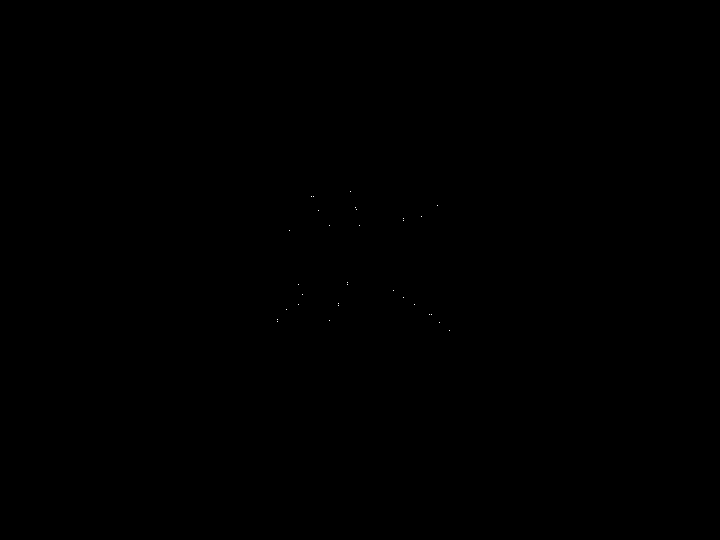

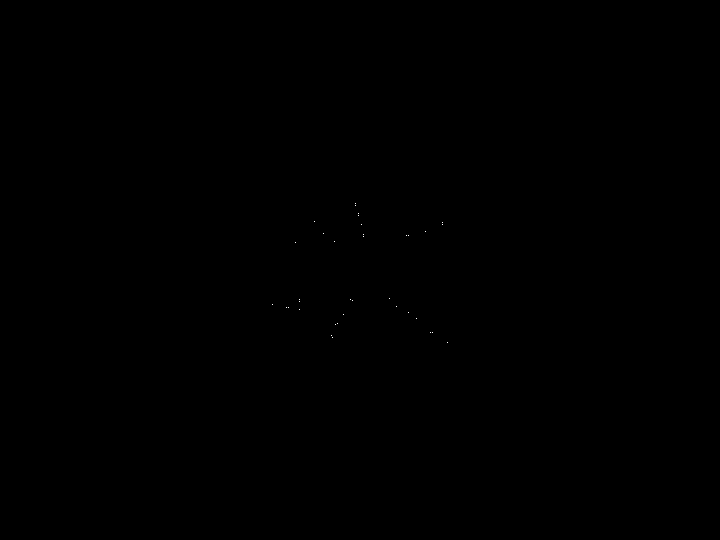

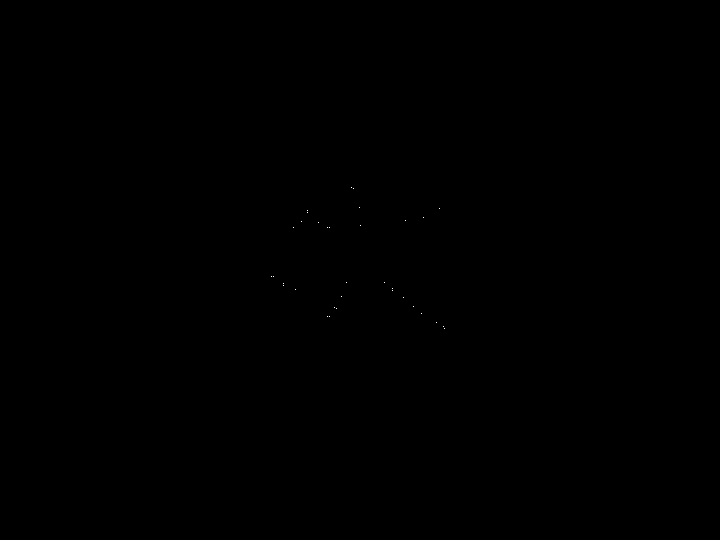

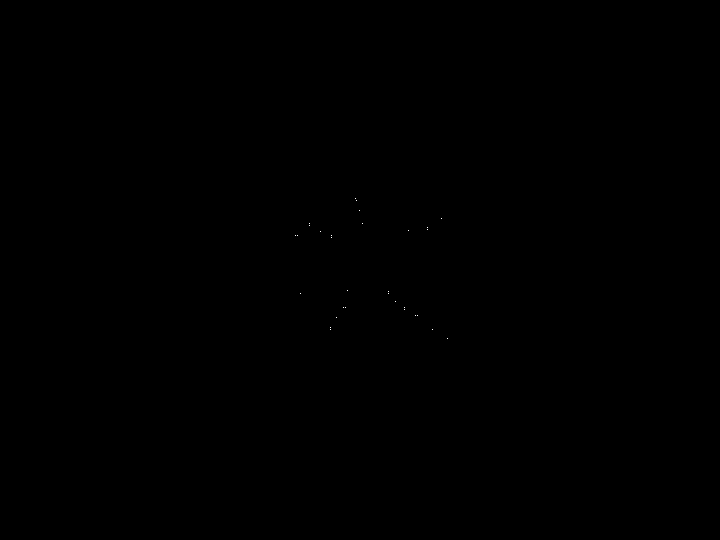

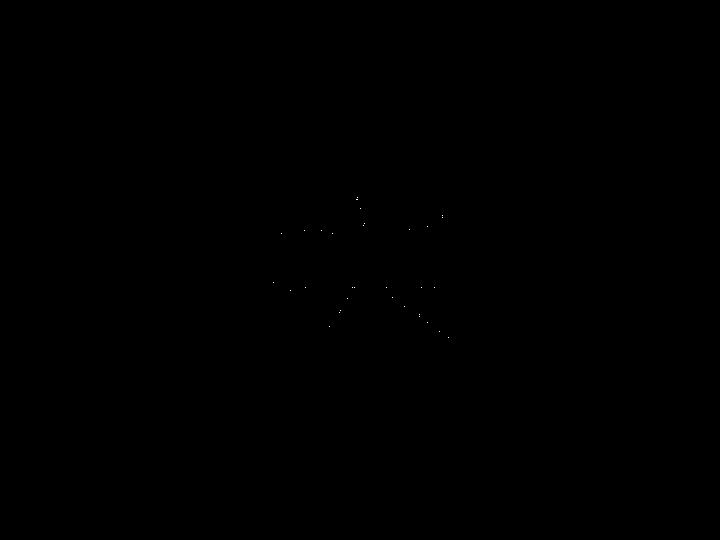

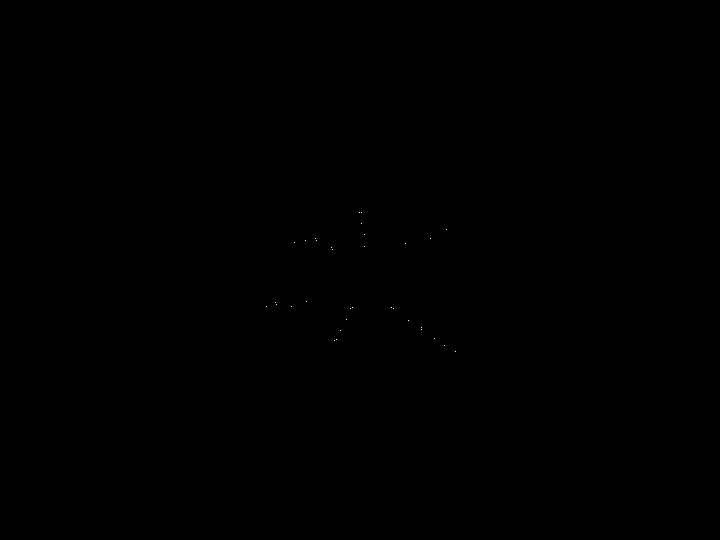

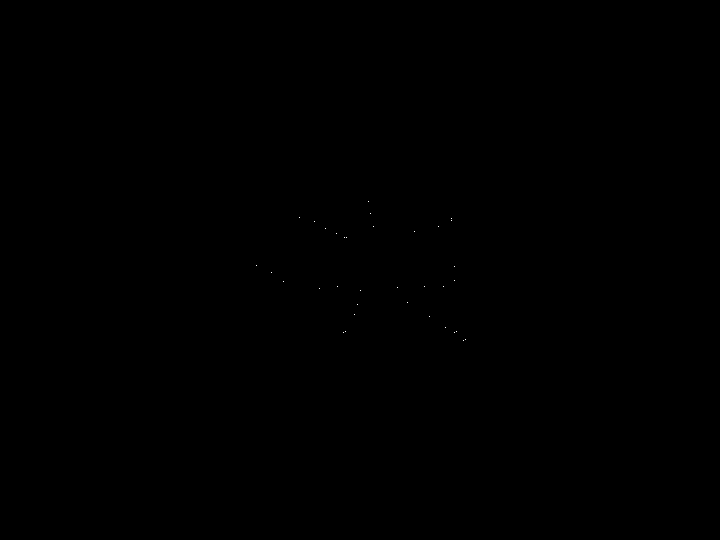

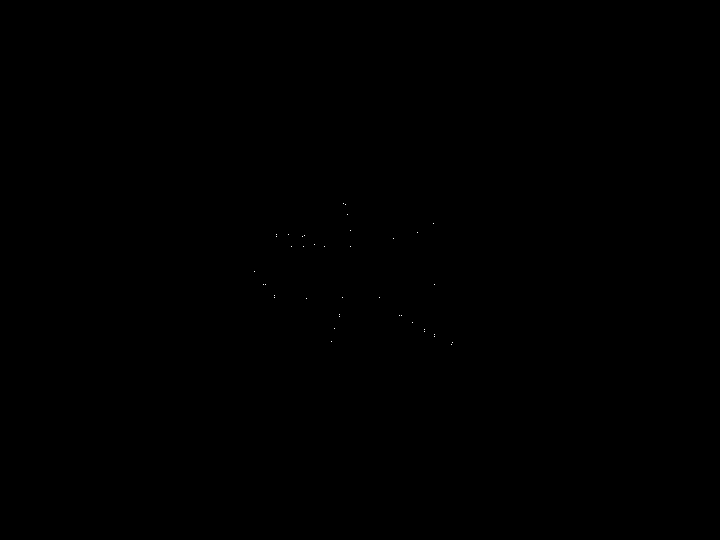

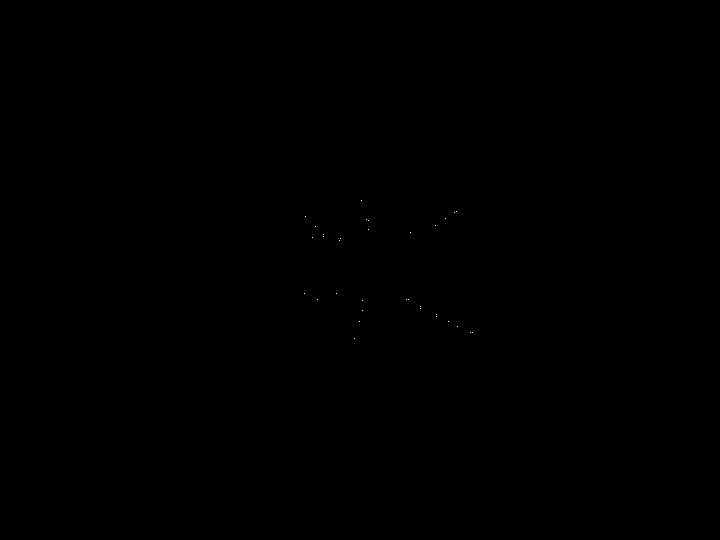

In [ ]:
for i in range(1, 10):
  draw_GFTT2_skeleton(i)

In [ ]:
import imageio
canny_image = []
# List of image filenames
for i in range(1, 40):
  path1 = '/content/output_image' + str(i) + '.jpg'
  canny_image.append(path1)
# Output video path and filename
output_video_path = 'canny_video.mp4'

# Create an empty list to store the image data
images = []

# Read each image and append it to the images list
for image_file in canny_image:
    image_path = image_file  # Replace 'path_to_directory' with the actual directory path
    image = imageio.imread(image_path)
    images.append(image)

# Save the images as a video using imageio
imageio.mimwrite(output_video_path, images, fps=1)  # Adjust the fps value as needed


# Applying Canny Edge Detection after Gaussian Filter

In [ ]:
from PIL import Image, ImageFilter
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

def gaussianBlur_canny(frame_num):
  img_url = '/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg'
  image = cv2.imread(img_url, cv2.IMREAD_GRAYSCALE)
  blurred = cv2.GaussianBlur(image, (5, 5), 0)
  edges = cv2.Canny(blurred, 0, 150)

  cv2_imshow(edges)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

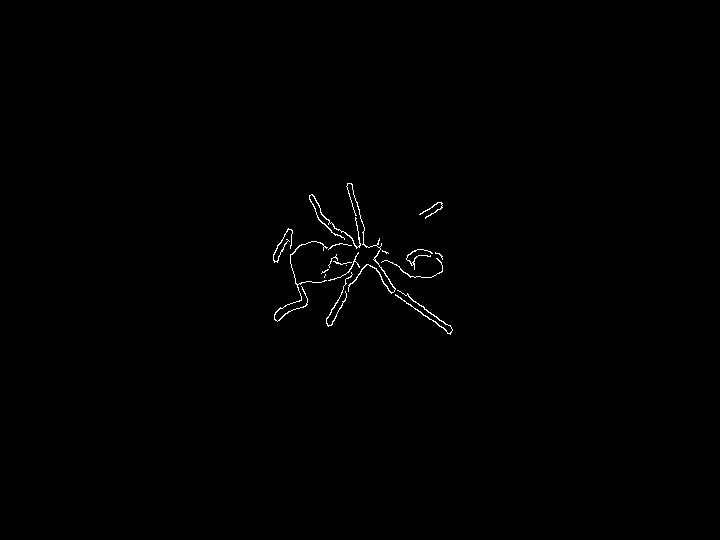

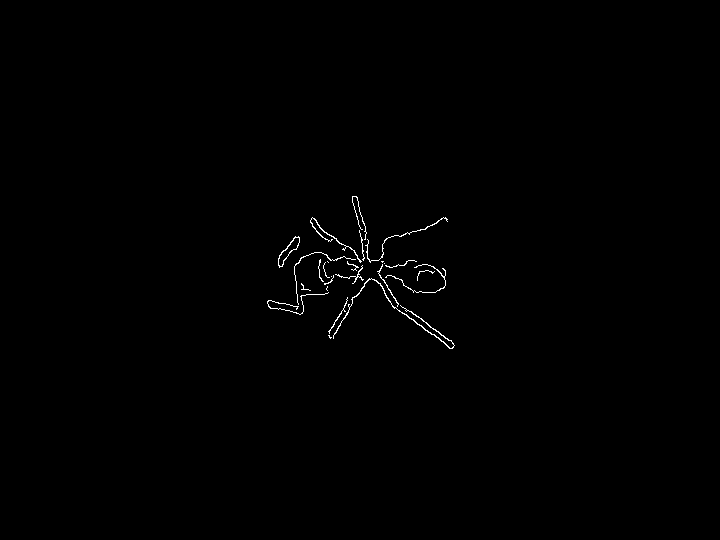

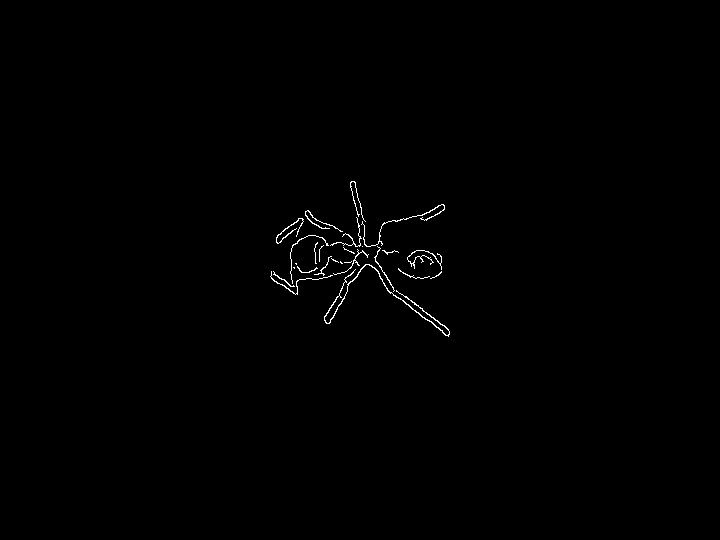

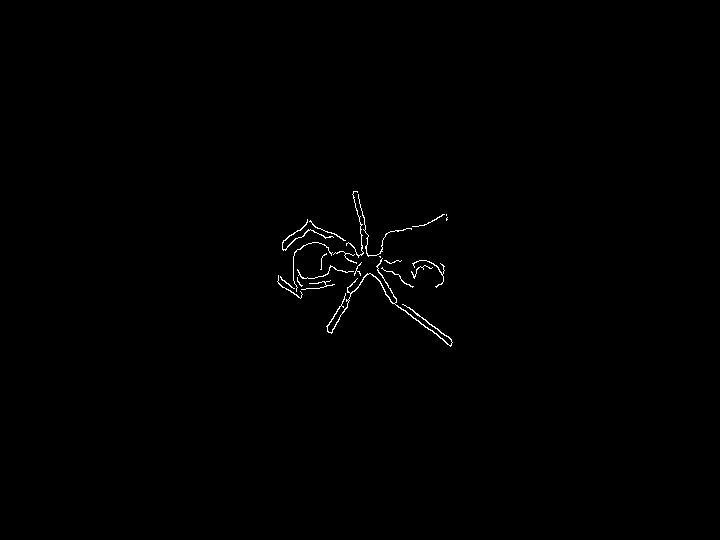

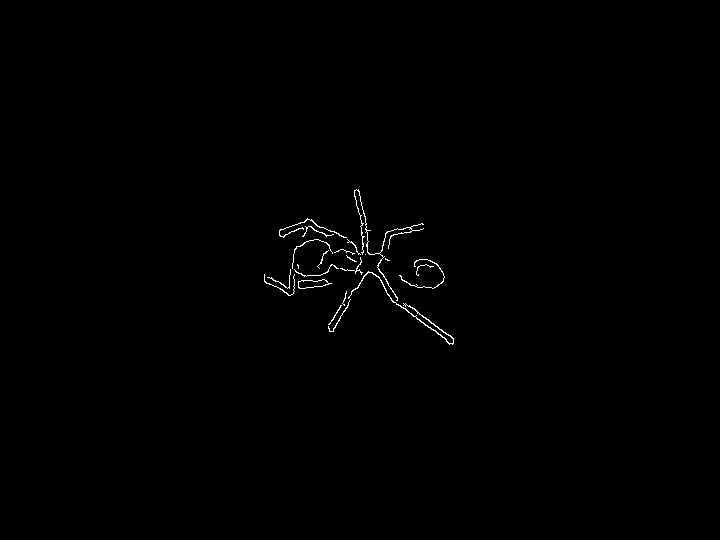

...

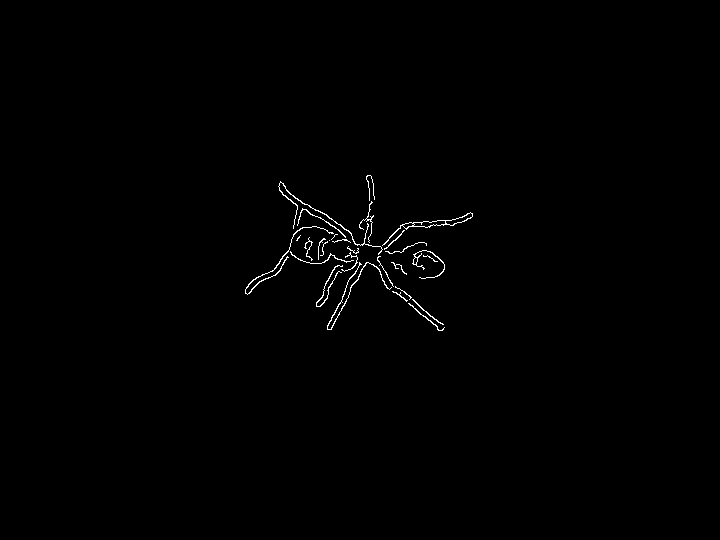

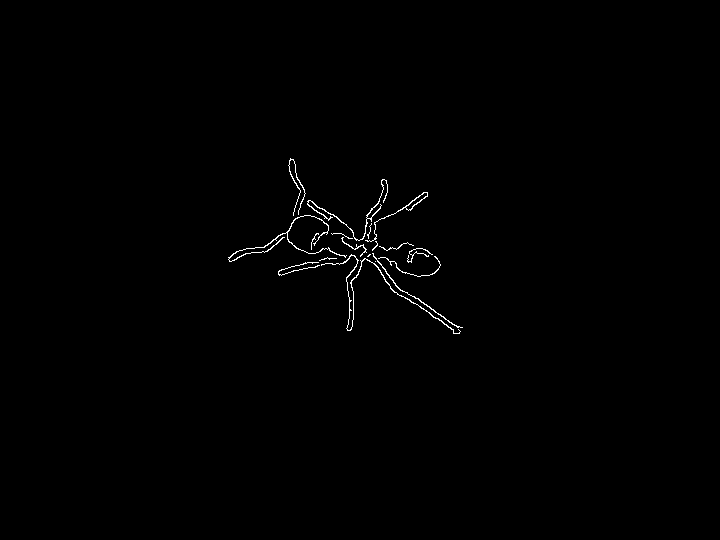

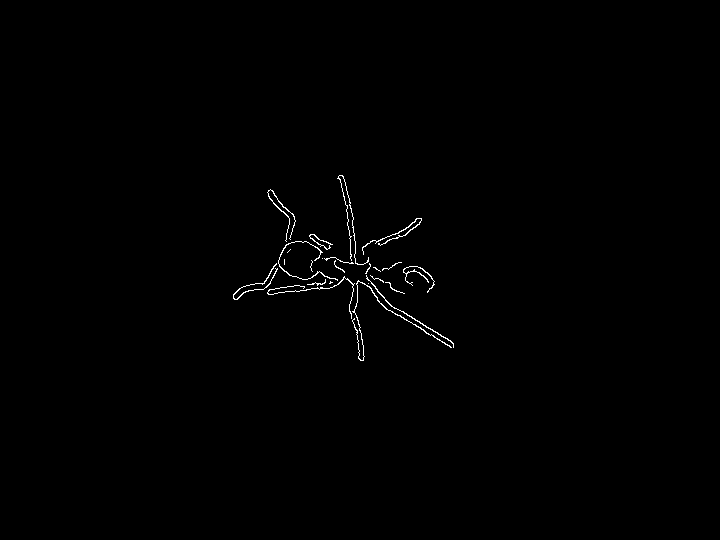

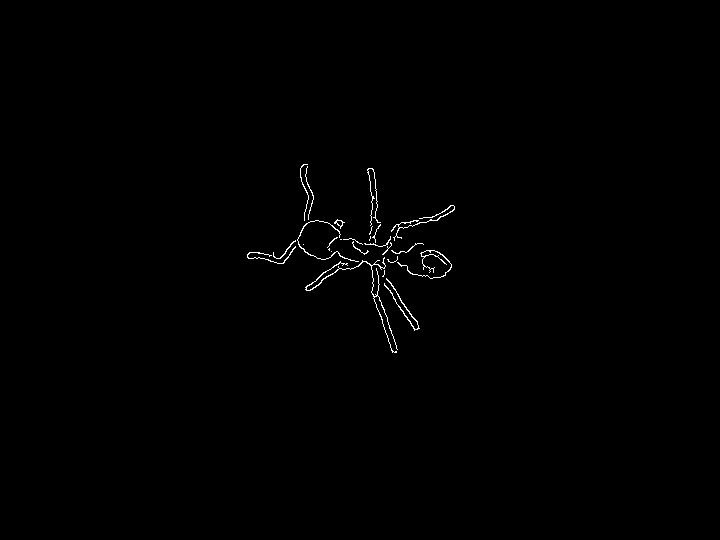

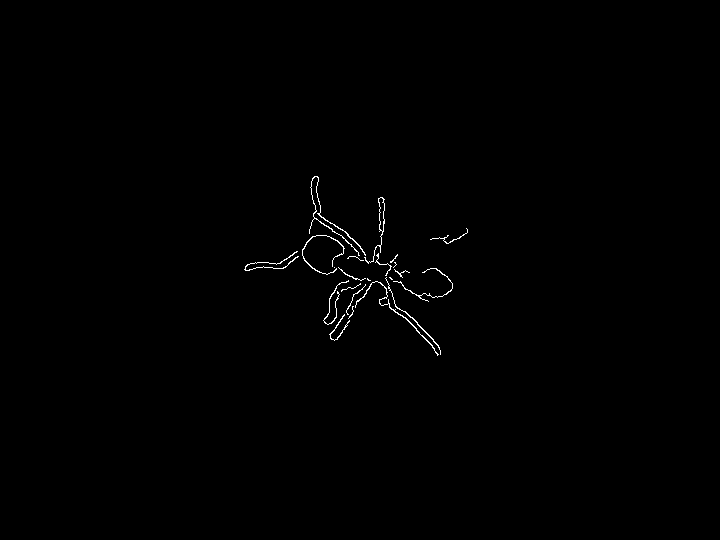

In [ ]:
for i in range(1, 40):
  gaussianBlur_canny(i)

# Canny Edge Detection

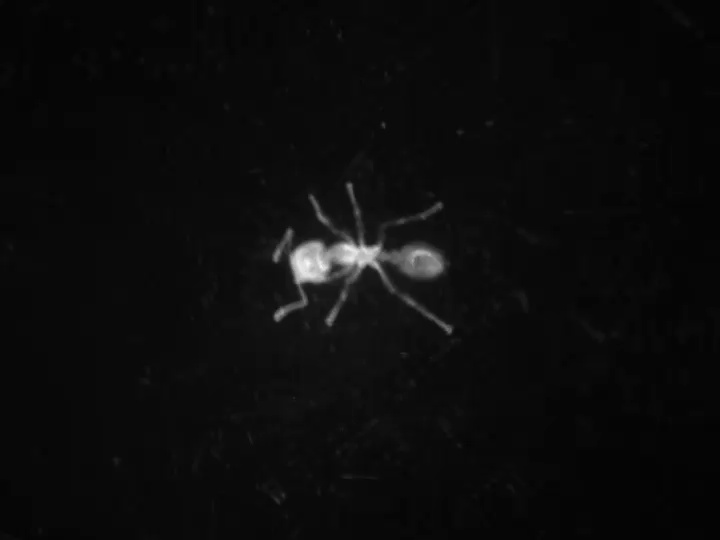

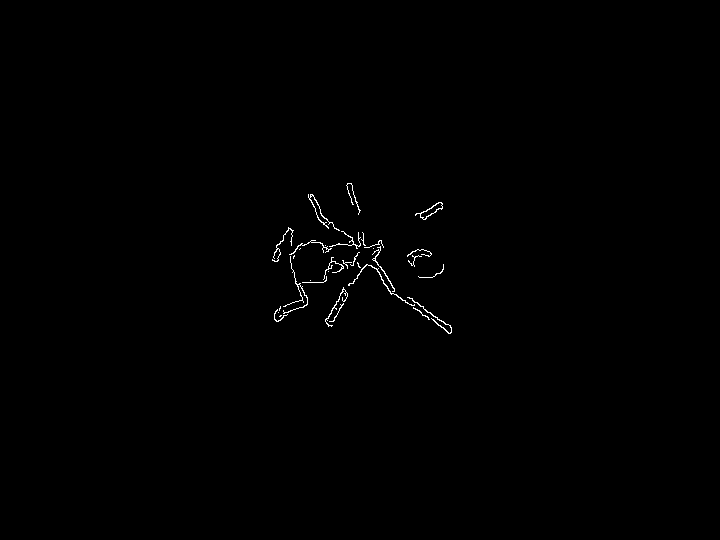

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread('/content/drive/MyDrive/parallel/image' + str(1) + '.jpg', 0)  # Load as grayscale

# Apply Canny edge detection
edges = cv2.Canny(image, 80, 200)

# Display the result
cv2_imshow(image)
cv2_imshow(edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

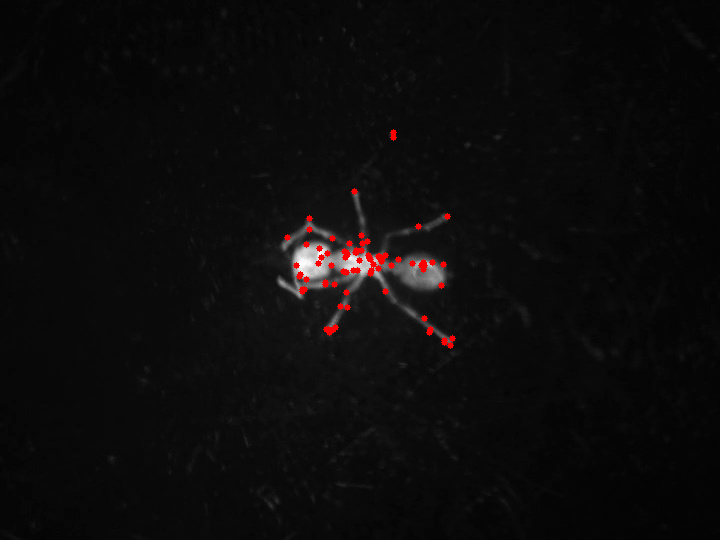

In [ ]:
import cv2
import numpy as np

# Load the image
image = cv2.imread('/content/drive/MyDrive/parallel/image' + str(4) + '.jpg', cv2.IMREAD_GRAYSCALE)

# Apply Canny edge detection
edges = cv2.Canny(image, 80, 200)

# Find contours in the edges
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

# Iterate over contours and find endpoints
endpoints = []
for contour in contours:
    # Approximate the contour to simplify it
    epsilon = 0.05 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)

    # Get the endpoints of the contour
    endpoints.append(approx[0][0])  # First point
    endpoints.append(approx[-1][0])  # Last point

# Draw the endpoints on the original image
output = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
for endpoint in endpoints:
    cv2.circle(output, tuple(endpoint), 3, (0, 0, 255), -1)

# Show the resulting image with endpoints
cv2_imshow(output)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
def canny(img_url): #this function combine used canny first and then apply good feature to track to obtain better accuracy
  image = cv2.imread(img_url, cv2.IMREAD_GRAYSCALE)
  blurred = cv2.GaussianBlur(image, (5, 5), 0)
  edges = cv2.Canny(blurred, 0, 150)

  # # Load the image
  # image = cv2.imread(img_url, 0)  # Load as grayscale
  # # Apply Canny edge detection
  # edges = cv2.Canny(image, 80, 200)
  # Apply good feature to track
  corners = cv2.goodFeaturesToTrack(edges, 40, 0.01, 10)
  corners = np.int0(corners)
  return corners

def feature_corners_draw(corner, img_url,frame_num):
  img = cv2.imread(img_url)
  for corner in corner:
    x, y = corner.ravel()
    cv2.circle(img, (x,y), 3, 255, -1)
  cv2_imshow(img)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

  output_image_path = 'output_image' + str(frame_num) + '.jpg'
  cv2.imwrite(output_image_path, image)

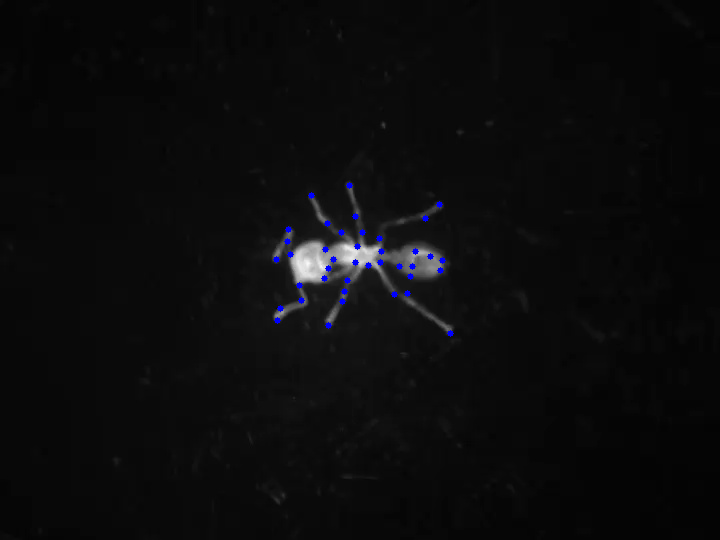

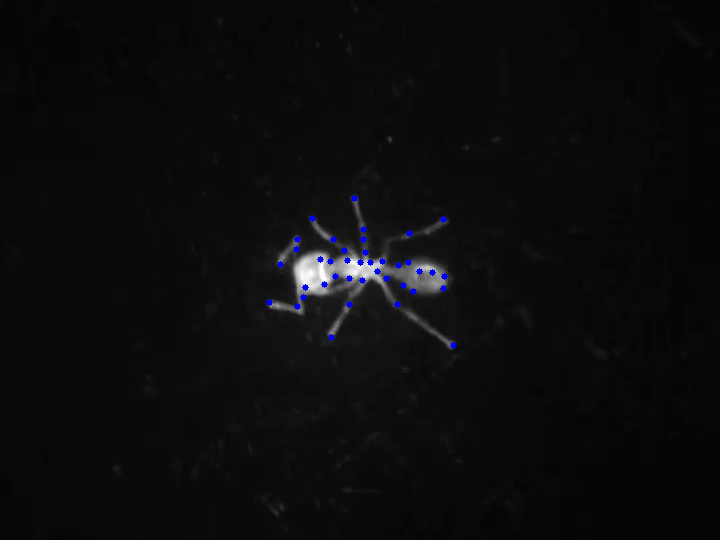

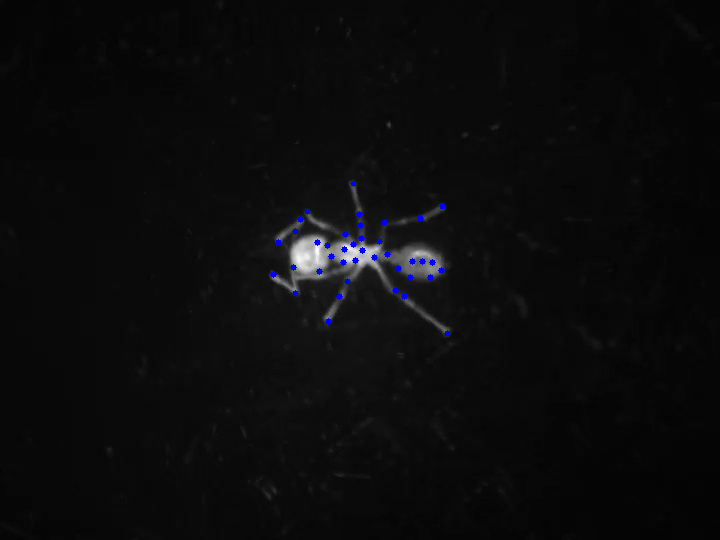

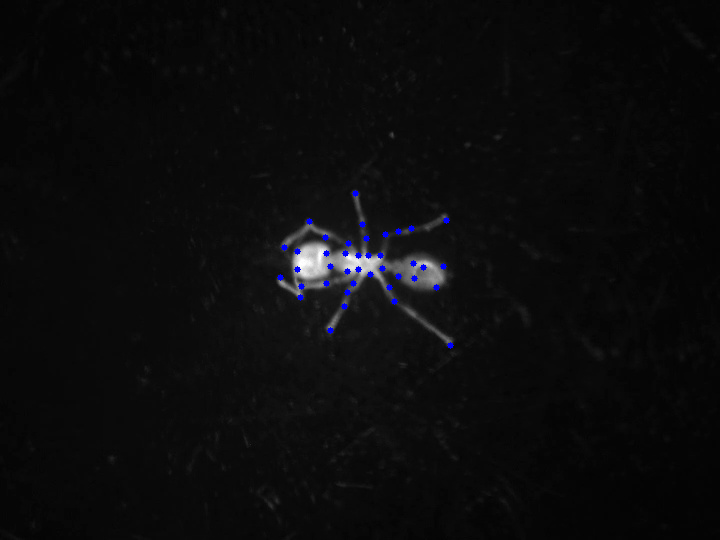

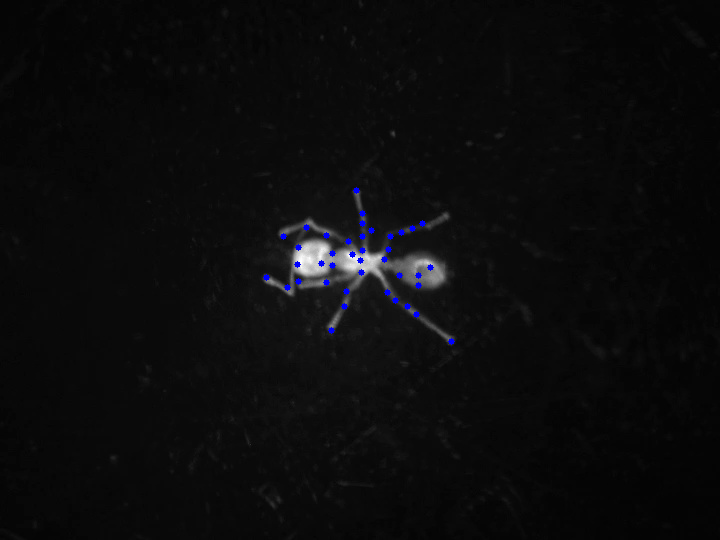

...

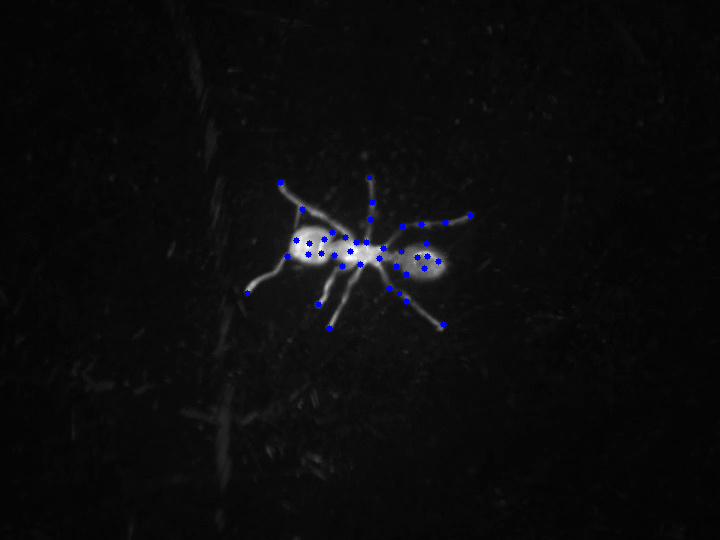

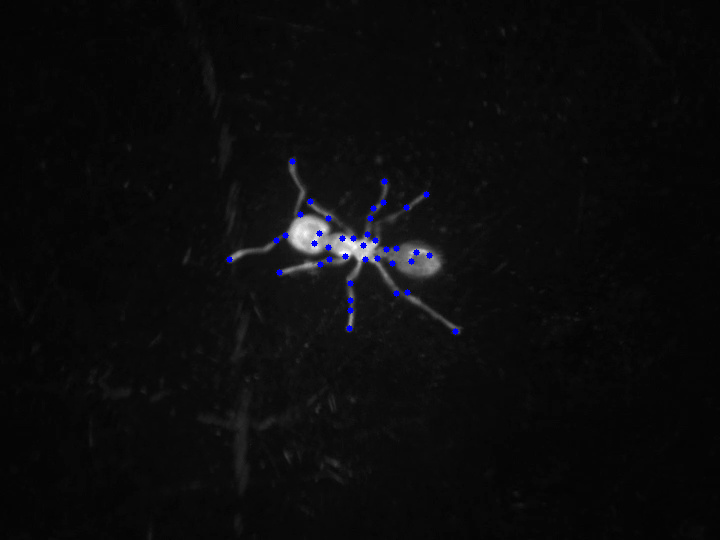

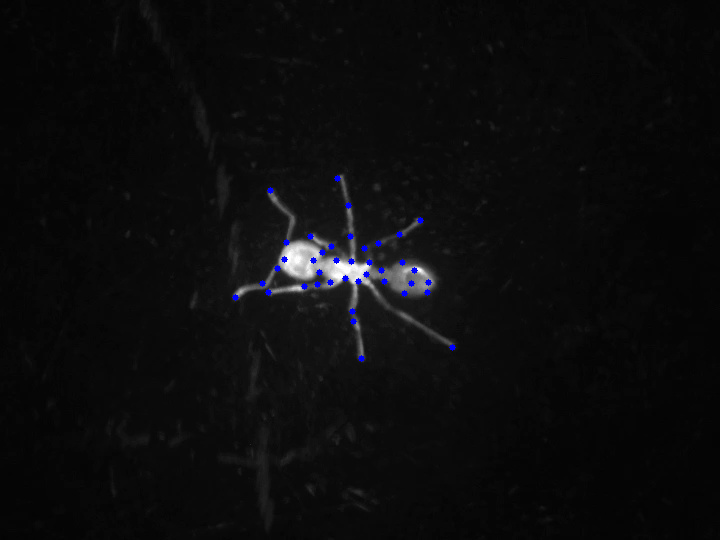

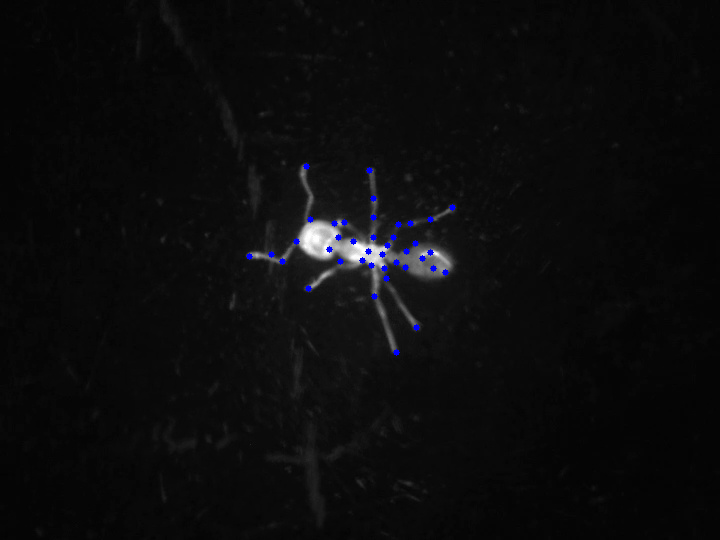

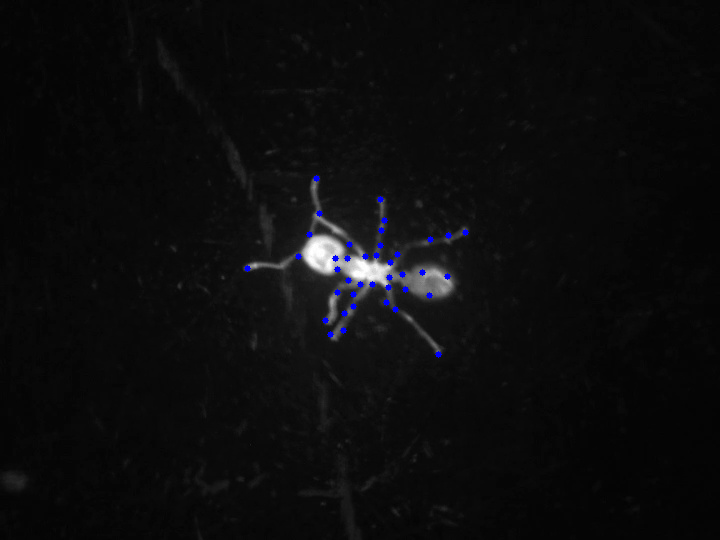

In [ ]:
for i in range(1, 40):
  feature_corners_draw(canny('/content/drive/MyDrive/parallel/image' + str(i) + '.jpg'), '/content/drive/MyDrive/parallel/image' + str(i) + '.jpg', i)

# Crop rectangle

<class 'numpy.ndarray'>
Shape of the image (540, 720, 3)


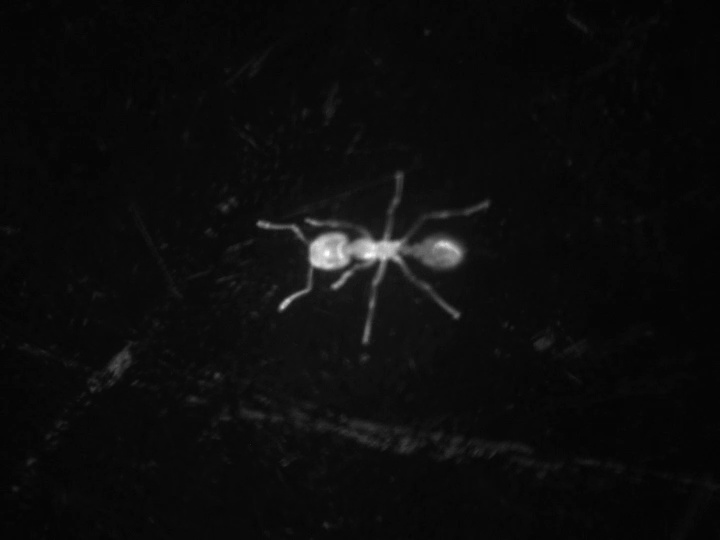

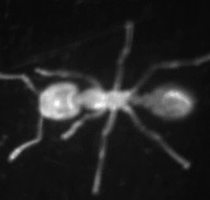

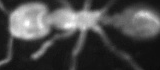

In [ ]:
import cv2

img = cv2.imread('/content/drive/MyDrive/parallel/image' + str(100) + '.jpg')
print(type(img))

# Shape of the image
print("Shape of the image", img.shape)

# [rows, columns]
# here x is y, y is x
# crop_whole = img[150:350, 270:480]
# crop_body = img[230:280, 300:460]

crop_whole = img[150:350, 270:480]
crop_body = img[230:300, 300:460]

cv2_imshow(img)
cv2_imshow(crop_whole)
cv2_imshow(crop_body)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
def cropping(canny_corners):
  t = canny_corners
  result1 = []
  final_result = []
  for i in t:
    if (230 < i[0][1] < 300) and (300 < i[0][0] < 460):
      result1.append(list(i[0]))

  for i in t:
    if list(i[0]) not in result1:
      final_result.append(i[0])

  return np.array(final_result)

In [ ]:
cropping(canny('/content/drive/MyDrive/parallel/image' + str(1) + '.jpg'))

array([[311, 195],
       [299, 285],
       [276, 259],
       [450, 333],
       [355, 216],
       [277, 320],
       [328, 325],
       [288, 229],
       [439, 204],
       [349, 185],
       [425, 218],
       [280, 308],
       [342, 301],
       [287, 241],
       [327, 223],
       [301, 300],
       [290, 254]])

In [ ]:
from PIL import Image

def Plot_Cropped(Corner, img_url):
  image = Image.open(img_url)
  image = np.float32(image)
  for corner in Corner:
    x, y = corner.ravel()
    cv2.circle(image, (x,y), 3, 255, -1)
  cv2_imshow(image)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

# Fitting in KNNS withoiut the Cropping method

In [ ]:
import math
def dot(vA, vB):
    return vA[0]*vB[0]+vA[1]*vB[1]

def ang(lineA, lineB):
    # Get nicer vector form
    vA = [(lineA[0][0]-lineA[1][0]), (lineA[0][1]-lineA[1][1])]
    vB = [(lineB[0][0]-lineB[1][0]), (lineB[0][1]-lineB[1][1])]
    # Get dot prod
    dot_prod = dot(vA, vB)
    # Get magnitudes
    magA = dot(vA, vA)**0.5
    magB = dot(vB, vB)**0.5
    # Get cosine value
    cos_ = dot_prod/magA/magB
    # Get angle in radians and then convert to degrees
    angle = math.acos(dot_prod/magB/magA)
    # Basically doing angle <- angle mod 360
    ang_deg = math.degrees(angle)%360

    if ang_deg-180>=0:
        # As in if statement
        return 360 - ang_deg
    else:

        return ang_deg

In [ ]:
def each_frame_angles(frame_number): #frame_number must larger than 0, because MyDrive/parallel/image0.jpg doesn't exist
  single_res = []
  single_image = canny('/content/drive/MyDrive/parallel/image' + str(frame_number) + '.jpg')

  for i in range(len(single_image)):
    single_res.append((single_image[i][0][0], single_image[i][0][1]))
  mean_point = np.mean(single_res, axis = 0)

  angle_1 = []
  mean_point_1frame = np.mean(single_res,axis=0)
  lineB_1 = (mean_point_1frame, (mean_point_1frame[0]-10, mean_point_1frame[1]))
  for i in range(len(single_res)):
    point_a_1 = single_res[i]
    lineA = (point_a_1,mean_point)
    lineB = (mean_point, (mean_point[0]-10, mean_point[1]))
    angle = ang(lineA, lineB)
    if point_a_1[1] > mean_point_1frame[1]:
      angle = -angle
    angle_1.append(round(angle,2))
  return angle_1

from sklearn.cluster import KMeans
angle_1 = each_frame_angles(1)
kmeans_angle = KMeans(init="random",n_clusters=6,n_init=10,max_iter=300,random_state=42)
kmeans_angle.fit(np.array(angle_1).reshape(-1, 1))
result_cate = [[],[],[],[],[],[]]
a = list(kmeans_angle.labels_)

In [ ]:
def knn_6points(frame_num):
  angle_1 = each_frame_angles(frame_num)
  kmeans_angle = KMeans(init="random",n_clusters=6,n_init=10,max_iter=300,random_state=42)
  kmeans_angle.fit(np.array(angle_1).reshape(-1, 1))
  result_cate = [[],[],[],[],[],[]]
  a = list(kmeans_angle.labels_)
  for i in range(6):
    for k in range(len(a)):
      if a[k] == i:
        result_cate[i].append(list(canny('/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg'))[k])
  return result_cate

In [ ]:
def test_6(frame_num):
  img_url = '/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg'
  img = cv2.imread('/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg', 0)
  img_tab = [[],[],[],[],[],[]]
  for i in range(6):
    for j in knn_6points(frame_num)[i]:
      img_tab[i].append((j[0][0], j[0][1]))
  colors = [(0, 255, 0), (255, 255, 0), (255, 255, 255), (255, 165, 0), (255, 153, 255), (255, 192, 203)]
  thickness = 4
  img = cv2.imread(img_url)
  overlay = img.copy()
  # for i in range(len(cluster_total)):
  #   for j in range(len(cluster_total[i])):
  #     cv2.circle(overlay, cluster_total[i][j], 3, colors[i], -1)

  for i in range(6):
    for j in img_tab[i]:
      cv2.circle(overlay, j, 6, colors[i], -1)

  alpha = 0.8 # Transparency factor.

  # Following line overlays transparent rectangle over the image
  img = cv2.addWeighted(overlay, alpha, img, 1 - alpha, 0)

  cv2_imshow(img)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

In [ ]:
def leg_tip(frame_num):
    result_tip = [[], [], [], [], [], []]
    mean_point = np.array([355, 260])
    all_points = knn_6points(frame_num)

    for i in range(6):
        distances = [np.linalg.norm(mean_point - point) for point in all_points[i]]
        val_a = max(range(1, len(all_points[i])), key=lambda j: distances[j])
        result_tip[i] = all_points[i][val_a]

    return sorted(result_tip, key=lambda x: x[0][0])


### Use KNN after using the template matching to remove main body part and extract the skeleton

In [ ]:
def angles_after_template_matching(frame_number): #frame_number must larger than 0, because MyDrive/parallel/image0.jpg doesn't exist
  single_res = []
  single_image = GFTT_after_removed_main_body(frame_number)

  for i in range(len(single_image)):
    single_res.append((single_image[i][0][0], single_image[i][0][1]))
  mean_point = np.mean(single_res, axis = 0)

  angle_1 = []
  mean_point_1frame = np.mean(single_res,axis=0)
  lineB_1 = (mean_point_1frame, (mean_point_1frame[0]-10, mean_point_1frame[1]))
  for i in range(len(single_res)):
    point_a_1 = single_res[i]
    lineA = (point_a_1,mean_point)
    lineB = (mean_point, (mean_point[0]-10, mean_point[1]))
    angle = ang(lineA, lineB)
    if point_a_1[1] > mean_point_1frame[1]:
      angle = -angle
    angle_1.append(round(angle,2))
  return angle_1

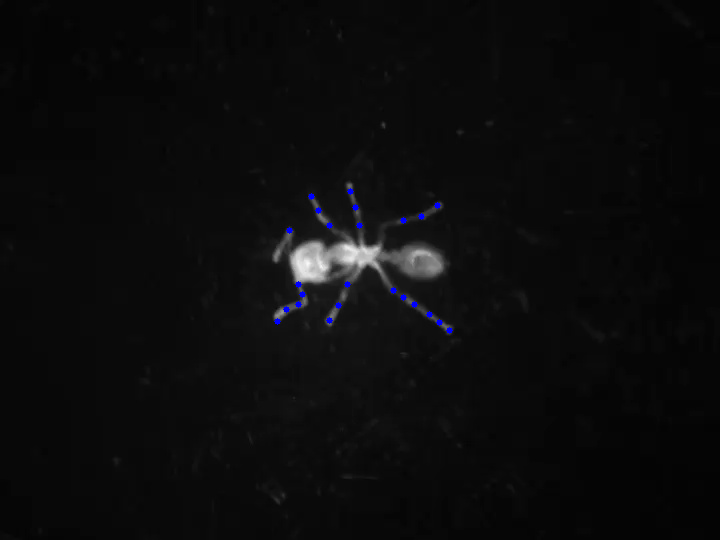

In [ ]:
feature_corners_draw(GFTT_after_removed_main_body(1), 1)

In [ ]:
def knn_6points_template(frame_num):
  angle_1 = angles_after_template_matching(frame_num)
  kmeans_angle = KMeans(init="random",n_clusters=6,n_init=10,max_iter=300,random_state=42)
  kmeans_angle.fit(np.array(angle_1).reshape(-1, 1))
  result_cate = [[],[],[],[],[],[]]
  a = list(kmeans_angle.labels_)
  for i in range(6):
    for k in range(len(a)):
      if a[k] == i:
        result_cate[i].append(GFTT_after_removed_main_body(frame_num)[k])
  return result_cate

In [ ]:
knn_6points_template(1)

[[array([[318, 210]]),
  array([[289, 230]]),
  array([[311, 196]]),
  array([[329, 225]])],
 [array([[355, 207]]), array([[350, 191]]), array([[359, 225]])],
 [array([[393, 290]]),
  array([[449, 330]]),
  array([[414, 304]]),
  array([[403, 297]]),
  array([[429, 314]]),
  array([[439, 322]])],
 [array([[302, 294]]),
  array([[286, 309]]),
  array([[298, 304]]),
  array([[298, 284]]),
  array([[277, 321]])],
 [array([[347, 284]]), array([[338, 305]]), array([[329, 320]])],
 [array([[403, 220]]), array([[421, 216]]), array([[437, 205]])]]

In [ ]:
def test_6_template(frame_num):
  img_url = '/content/drive/MyDrive/parallel/image' + str(frame_num) + '.jpg'
  img = cv2.imread(img_url, 0)
  img_tab = [[],[],[],[],[],[]]
  for i in range(6):
    for j in knn_6points_template(frame_num)[i]:
      img_tab[i].append((j[0][0], j[0][1]))
  colors = [(0, 255, 0), (255, 255, 0), (255, 255, 255), (255, 165, 0), (255, 153, 255), (255, 192, 203)]
  thickness = 4
  img = cv2.imread(img_url)
  overlay = img.copy()
  # for i in range(len(cluster_total)):
  #   for j in range(len(cluster_total[i])):
  #     cv2.circle(overlay, cluster_total[i][j], 3, colors[i], -1)

  for i in range(6):
    for j in img_tab[i]:
      cv2.circle(overlay, j, 6, colors[i], -1)

  alpha = 0.8 # Transparency factor.

  # Following line overlays transparent rectangle over the image
  img = cv2.addWeighted(overlay, alpha, img, 1 - alpha, 0)

  cv2_imshow(img)
  cv2.waitKey(0)
  cv2.destroyAllWindows()

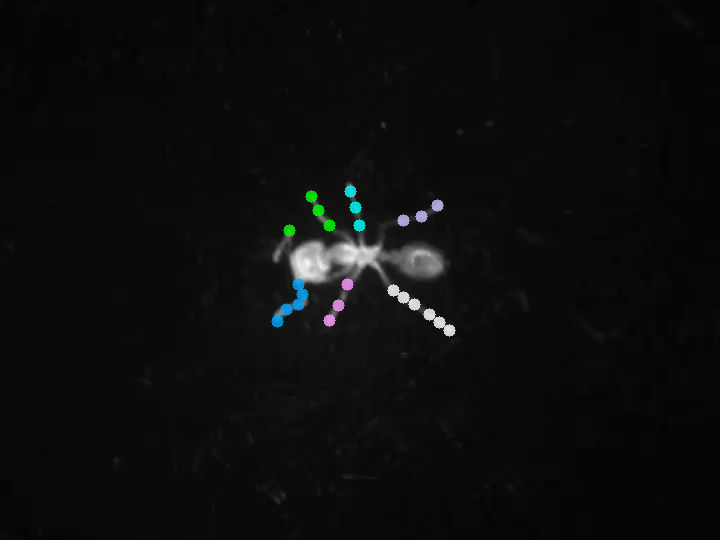

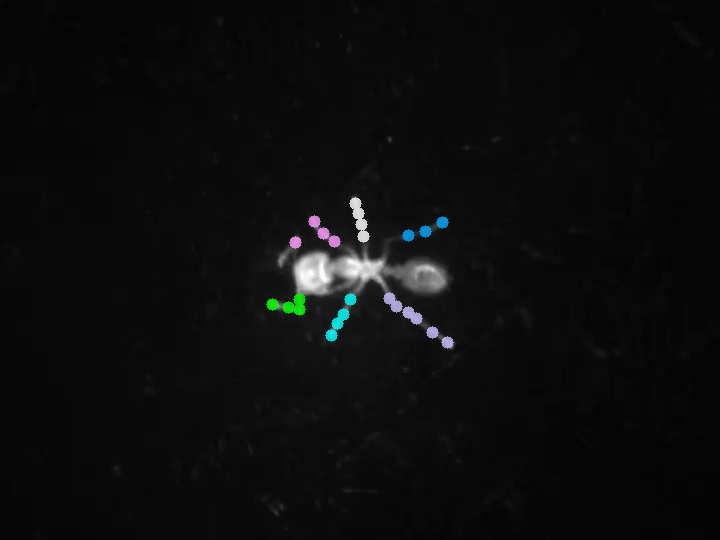

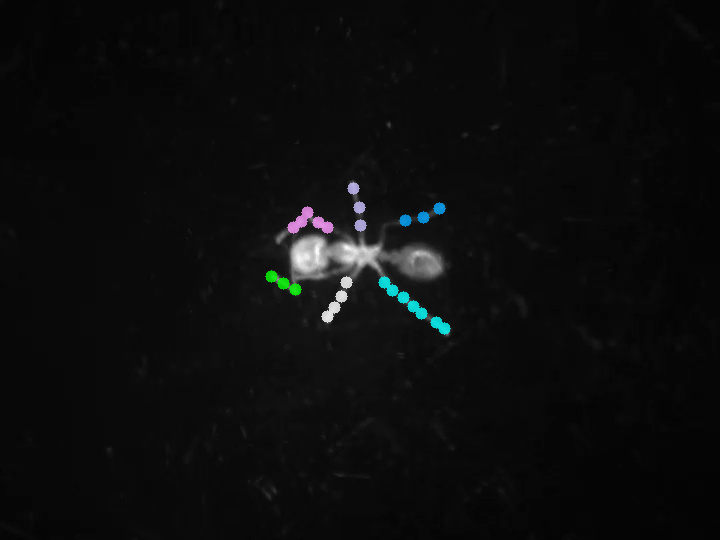

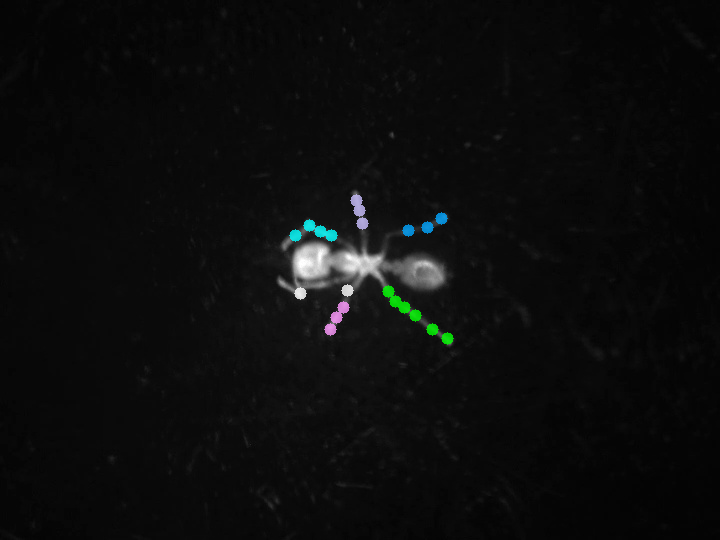

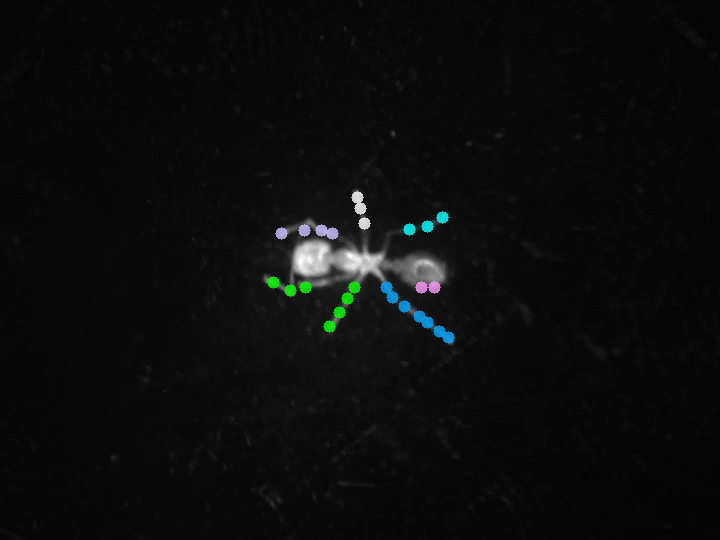

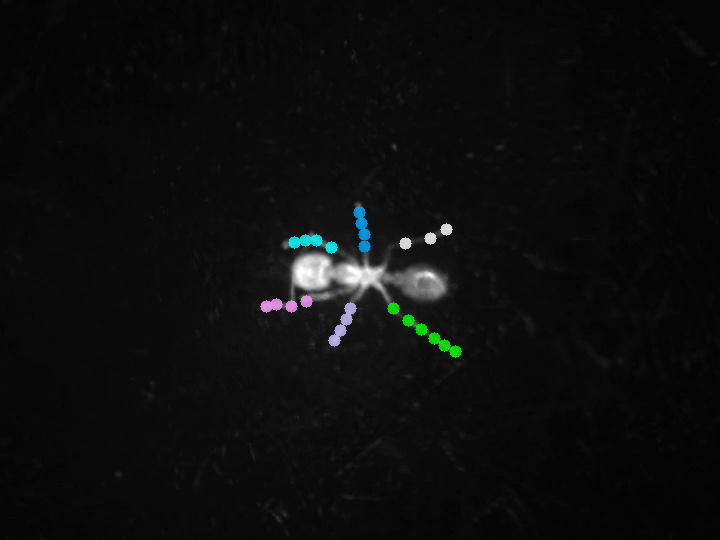

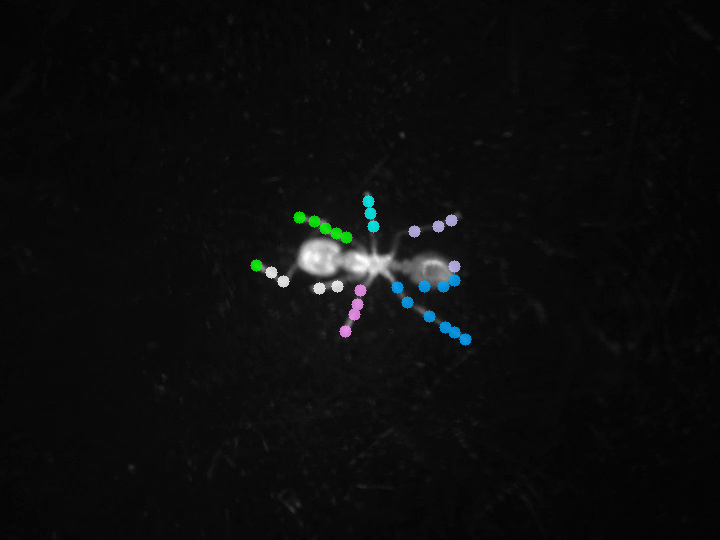

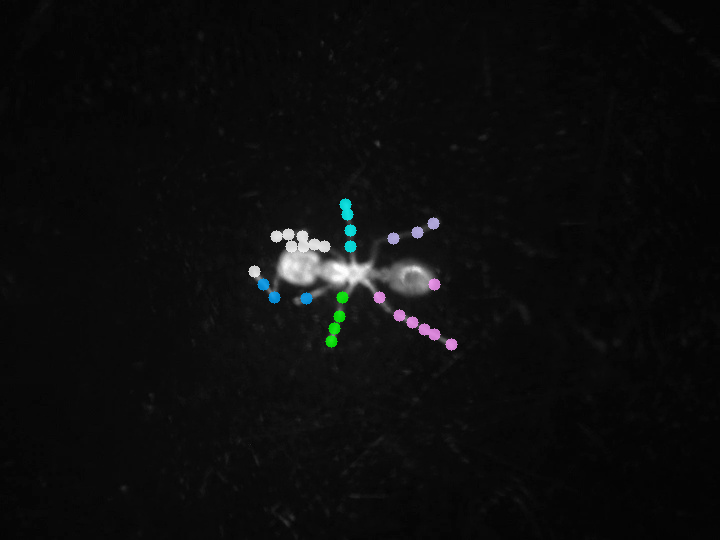

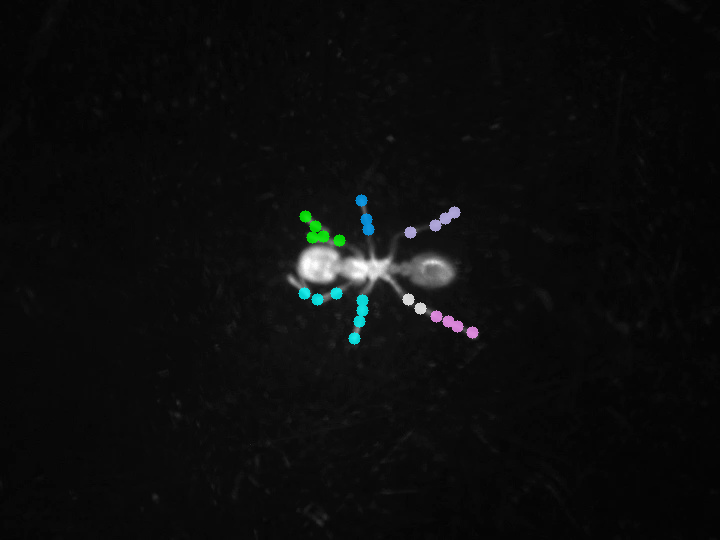

In [ ]:
for i in range(1, 10):
  test_6_template(i)